# Bayesian inference

1 Unified approach to probabilistic model inference using Bayes theorem:

$$
p(model | data)\sim p(data | model)\cdot p(model)
$$

e.g. for the linear regression $y=wx$ or $y\sim {\cal N}(w x,\sigma^2)$:

$$
p(w|data)\sim p(data|w)p(w)
$$

2 Accounts for any prior theoretic or empirical knownledge expressed through $p(model)$:

* reasonable range or theoretic distribution for the model parameters
* parmeters estimated from a model using a previous data sample (and now updating with a larger or more recent sample) 
* some general guideline, like not having the magnitide of the coefficients too high (Ridge, Lasso)
* uninformed prior (for example, uniform with equal probabilities, normal with high variance, or other form charachterized by a broad spread or high entropy)

Implementation: 
* simulation of the model with different parameters sampled from prior
* assessing the likelihood of the data given the model
* adjusting the likelihood of parameters to posteriors $p(model | data)$ according to Bayes theorem

Challenges: 
* computational: simulation of multiple samples for complex multinomial priors
* analytic: posterior distribution might be empirically assessed but have no closed form analytic expression

## Bayesian linear regression

## Example 1. Simple univariate regression - real-estate price prediction

Consider an example of predicting prices of individual homes $y$ vs their sizes $x$:
$$
y=w x+\varepsilon,
$$
given a series of single-dimensional observations $D=\{(y_i,x_i), i=1..N\}$, where $w$ is the slope coefficient to fit (in our case - average price of the square foot) and $\epsilon$ is the error term (deviation of the specific price from the predicted value), assuming that 
$$
\varepsilon\sim {\cal N}(0,\sigma^2).
$$
As we remember ordinary least square (OLS) estimate in the univariate case gives a simple estimate $\hat{w}$ for the slope coefficient $w$:
$$
\hat{w}=\frac{\sum_i y_i x_i}{\sum_i x_i^2}.
$$
After we get $w=\hat{w}$ it is easy to estimate the standard error 
$$
\sigma=\sqrt{\frac{\sum_i (y_i-\hat{w} x_i)^2}{N}}.
$$

In [1]:
import numpy as np
import pandas as pd

import pymc3 as pm
import arviz as az
import theano as thno
import theano.tensor as tt
import xarray as xr
from pymc3.distributions import Interpolated

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

from collections import OrderedDict
from time import time

import statsmodels.formula.api as smf
import statsmodels.api as sm

from scipy import stats
from scipy import integrate
from scipy.optimize import fmin_powell


%config InlineBackend.figure_format = 'retina'
az.style.use("arviz-darkgrid")
print(f"Running on PyMC3 v{pm.__version__}")
print(f"Running on ArviZ v{az.__version__}")

import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)
%matplotlib inline

Running on PyMC3 v3.11.5
Running on ArviZ v0.12.1


In [2]:
#pylab.rcParams['figure.figsize'] = [12,8]

In [3]:
#read real estate sample data

sample_all = pd.read_csv('REsample1.csv')
sample_all.head()

,Unnamed: 0,borough,neighborhood,building_class_category,tax_class_present,block,lot,easement,building_class_present,address,...,land_sq_feet,gross_sq_feet,year_built,tax_class_time_sale,build_class_time_sale,sale_price,sale_date,serialid,sale_year,sale_month
0,5631,3,BAY RIDGE,01 ONE FAMILY HOMES,1,5871,91,NaN,A5,24 BAY RIDGE PLACE,...,1600,1400,1910,1,A5,585000.0,2009-10-29,5631,9,9
1,5635,3,BAY RIDGE,01 ONE FAMILY HOMES,1,5882,38,NaN,A5,7014 LOUISE TERRACE,...,1169,1224,1925,1,A5,515000.0,2009-10-15,5635,9,9
2,5636,3,BAY RIDGE,01 ONE FAMILY HOMES,1,5882,50,NaN,A5,7009 LOUISE TERRACE,...,945,1836,1925,1,A5,499900.0,2009-04-20,5636,9,3
3,5637,3,BAY RIDGE,01 ONE FAMILY HOMES,1,5882,80,NaN,A5,7002 COLONIAL ROAD,...,1121,1330,1925,1,A5,525000.0,2009-09-02,5637,9,8
4,5638,3,BAY RIDGE,01 ONE FAMILY HOMES,1,5882,81,NaN,A5,7004 COLONIAL ROAD,...,1118,1224,1925,1,A5,400000.0,2009-07-24,5638,9,6


In [4]:
#first fit the regression for the entire sample

w_all = sum(sample_all.sale_price*sample_all.gross_sq_feet) / sum(sample_all.gross_sq_feet**2)

#estimate the standard error sigma

s_all = np.std(sample_all.sale_price-sample_all.gross_sq_feet * w_all)
print('Estimated w = {0}, sigma = {1}'.format(w_all,s_all))

Estimated w = 423.2627749191691, sigma = 387363.5777545546


In [5]:
sample_all.shape

(309, 25)

In [6]:
#now redo the regression for just the first 100 records

sample_1 = sample_all.loc[0:99]

w_1 = sum(sample_1.sale_price*sample_1.gross_sq_feet) / sum(sample_1.gross_sq_feet**2)
s_1 = np.std(sample_1.sale_price-sample_1.gross_sq_feet * w_1)
print('Estimated first 100: w ={0}'.format(w_1))

Estimated first 100: w =369.71390461235694


/Users/ryanng/opt/anaconda3/lib/python3.9/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


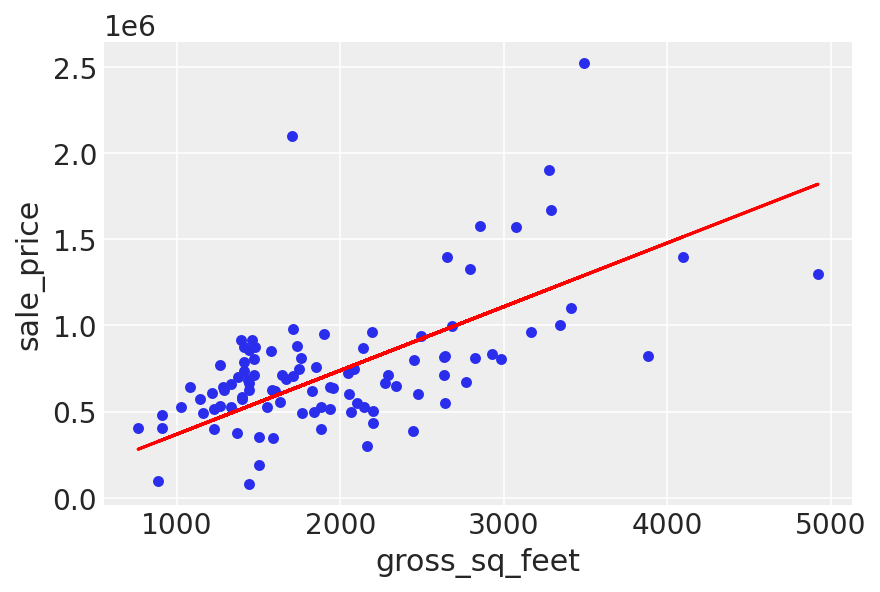

In [7]:
#visualize the fit

sample_1.plot(kind='scatter',x='gross_sq_feet',y='sale_price')

# regression equation for sale_price ~ gross_square_feet (y = w * x):
y_1 = w_1 * sample_1.gross_sq_feet
plt.plot(sample_1.gross_sq_feet,y_1,'r-');

We see quite a deviation in the estimates $\hat{w}$ obtained - so the OLS estimate depends on the sample choice and uses to vary from one sample to another. So for any particular choice of the training sample there is no guarantee that the estimate $\hat{w}$ is indeed a true value for $w$ - we should admit uncertainty in our estimate, which OLS does not really allow to make, but the further Bayesian framework will.

# Bayesian univariate regression

Also imagine that we already have certain prior knowledge about $w$ for example this would be the case if we already studied some sample of house prices before. Can we take this into account somehow? The prior knowledge can be expressed through a prior distribution $p(w)$.

Consider a probabilistic version of a univariate regression:
$$
y\sim {\cal N}(w x,\sigma^2),
$$
assuming that the variance $\sigma^2$ is given or at least independent on $w$ and the only real-valued single dimensional coefficient to estimate based on a series of single-dimensional observations $D=(Y,X)=\{(y_i,x_i), i=1..N\}$ is $w$. 

In a similar manner as we just did for fitting a normal distribution, each single observation changes a given conjugate normal prior:
$$
w\sim {\cal N}(w^*,\sigma^*)
$$
to a posterior:

$$
p(w|y=y_i, x=x_i)\sim p(y=y_i|w,x=x_i)p(w)
$$

$$
\sim
$$

$$
e^{-\frac{(y_i-w x_i)^2}{2\sigma^2}-\frac{(w-w^*)^2}{2(\sigma^*)^2}}
$$

$$
\sim
$$

$$
e^{-w^2 \frac{x_i^2(\sigma^*)^2+\sigma^2}{2\sigma^2(\sigma^*)^2}+w \frac{(\sigma^*)^2 y_i x_i+\sigma^2 w^*}{2\sigma^2(\sigma^*)^2}}
$$

$$
\sim
$$

$$
e^{\frac{\left(w-\frac{ \sigma^{-2} y_i x_i +(\sigma^*)^{-2} w^*}{ \left(x_i^2\sigma^{-2}+(\sigma^*)^{-2}\right)}\right)^2}{\frac{2 }{(\sigma^*)^{-2}+x_i^2\sigma^{-2}}}}
$$
so posterior distribution is also normal.


In order to add all the observations from $D$ one can either iterate the above process or consider a single equation based on a multi-variable probability distribution, which is easy to handle assuming that different observations are independent:
$$
p(w|Y, X)\sim p(Y|w,X)p(w)=p(w)\prod\limits_i p(y=y_i|w,x=x_i)\sim e^{-\sum\limits_i \frac{(y_i-w x_i)^2}{2\sigma^2}-\frac{(w-w^*)^2}{2(\sigma^*)^2}}=e^{-\frac{RSS(w)}{2\sigma^2}-\frac{(w-w^*)^2}{2(\sigma^*)^2}}\hspace{5ex} (1)
$$
If one needs a specific estimate $\hat{w}$ for $w$ then it could be found as the most probable value from
$$
\hat{w}=argmax_w p(w|Y, X)=argmin_w\left[\frac{RSS(w)}{2\sigma^2}+\frac{(w-w^*)^2}{2(\sigma^*)^2}\right]\hspace{5ex} (2)
$$

$$
p(w|Y, X)\sim e^{-w^2 \frac{\sum_i x_i^2(\sigma^*)^2+\sigma^2}{2\sigma^2(\sigma^*)^2}+w \frac{(\sigma^*)^2 \sum_i y_i x_i+\sigma^2 w^*}{2\sigma^2(\sigma^*)^2}}\sim e^{\frac{\left(w-\frac{ \sigma^{-2} \sum_i y_i x_i +(\sigma^*)^{-2} w^*}{\left(\sum_i x_i^2\sigma^{-2}+(\sigma^*)^{-2}\right)}\right)^2}{\frac{2}{(\sigma^*)^{-2}+\sum_i x_i^2\sigma^{-2}}}}\sim
$$

$$
\sim {\cal N}\left(\frac{ \sigma^{-2} \sum_i y_i x_i +(\sigma^*)^{-2} w^*}{\left(\sum_i x_i^2\sigma^{-2}+(\sigma^*)^{-2}\right)},
\frac{1}{\sqrt{(\sigma^*)^{-2}+\sum_i x_i^2\sigma^{-2}}}\right)
$$

### Conjugate priors

Conjugate priors are priors that induce a known distribution in the posterior.  Assuming a good reason for pairing the Likelihood with a conjugate Prior, the Posterior will be a known distribution.  For example, consider

$X \sim Bernoulli(\theta)$

The likelihood takes the form:

$f(x|\theta) = \prod_{i=1}^n \theta^{x_i}(1-\theta)^{1-x_i} = \theta^{k}(1-\theta)^{n-k},$ where $k= \sum x_i$

With \\(\theta\\) as the random variable, it appears to have the functional kernel of the distribution of a beta.  Assuming a beta form for the Prior:

$f(x|\theta) \ast p(\theta) \propto \theta^{k}(1-\theta)^{n-k} \ast \theta^{\alpha-1}(1-\theta)^{\beta-1} = \theta^{\alpha+k-1}(1-\theta)^{\beta+n-k-1}$

which is clearly: \\(Beta(\alpha+k,\beta+n-k)\\) in \\(\theta\\).  

IF, we are modelling a Bernoulli process and use a prior with a Beta distribution, our posterior has a known distribution with parameters as shown.

Common conjugate priors by likelihood type:  
likelihood - prior   
Binomial - beta  
Poisson - Gamma  
Normal (known \\(\sigma^2\\)) - Normal  
Normal (known \\(\mu\\)) - inverse-gamma  
Multivariate normal (known \\(\Sigma\\)) - inverse-Wishart  

<br>
<br>
<hr style="border:2px baby blue"> </hr>

### Uninformed prior

In case of an unfinformed prior with $\sigma^*\to \infty$ the above estimate (2) is tends to be equivalent to the one given by the regular OLS, i.e. to
$$
RSS(w)\to \min
$$
However in addition to the single best fit slope coefficient estimate (2), Bayesian regression also provides an entire probabilistic normal distribution
$$
w\sim {\cal N}\left(\frac{\sum_i x_i y_i}{\sum_i x_i^2},\frac{\sigma}{\sqrt{\sum_i x_i^2}}\right)
$$
for the possible values of $w$, being able to explain from the rigorous probabilistic standpoint the meaning behind the confidence intervals and hypothesis testing.

One point here is that so far we consider $\sigma$ as given. There is a more sophisticated Bayesian framework which allows to estimate it together with $w$ (conceptually just enough to consider a vector of two latent variables $w,\sigma$ instead of $w$ and specify its joint prior distribution, although maths is much heavier in that case). For now we can simply rely on the streightforward max-likelihood estimate
$$
\hat{\sigma}^2=\frac{RSS(\hat{w})}{N}
$$
also being an actual sample standard deviation of the set of observed prediction errors for the optimal $w=\hat{w}$.

## Example 1 revisited. Distribution for the sq.foot price

In [8]:
# assess the distibution of the parameter for the entire sample

#we already have the estimate, just need to select sigma here using formulas above- take the one we estimated for the entire sample

s_1= s_all/(sum(sample_1.gross_sq_feet**2)**0.5)

In [9]:
print('w ~ N({0},{1})'.format(w_1,s_1))

w ~ N(369.71390461235694,18.29352380197333)


notice that the standard deviation we found for $w$ depends on the choice of $\sigma$ and might become different if we take $\sigma$ based on the considered subsample rather than the entire sample as we did.

## Example 2. Bayesian regression example - tuning the houses price regression trained above

Now if say we have the results of the previos estimate (but not retain the training data anymore) and later find more training data to consider, we can further adjust the former estimate through the above Bayesian framework.

In [10]:
#consider the remaining part of the housing prices data separately
sample_2=sample_all.loc[100:]
#and compute the OLS estimate
w_2=sum(sample_2.sale_price*sample_2.gross_sq_feet)/sum(sample_2.gross_sq_feet**2)
print('Estimated w={0}'.format(w_2))

Estimated w=450.92131889689307


In [11]:
#now implement Bayesian regression starting from the prior obtained based on the first sample w ~ N(369.713904612,18.293523802)

s_all2=1/s_all**2; s_12=1/s_1**2

w_12 = (s_all2*sum(sample_2.sale_price*sample_2.gross_sq_feet)+s_12*w_1)/(s_all2*sum(sample_2.gross_sq_feet**2)+s_12)
s_12 = (s_all2*sum(sample_2.gross_sq_feet**2)+s_12)**(-0.5)
print('w ~ N({0},{1})'.format(w_12,s_12))

w ~ N(423.2627749191691,10.676138164724133)


This is already pretty consistend with what python will give us if we take the entire training sample at once

In [12]:
lm = smf.ols(formula='sale_price ~ gross_sq_feet -1', data = sample_all).fit()
print(lm.summary())

                                 OLS Regression Results                                
Dep. Variable:             sale_price   R-squared (uncentered):                   0.835
Model:                            OLS   Adj. R-squared (uncentered):              0.835
Method:                 Least Squares   F-statistic:                              1562.
Date:                Tue, 18 Apr 2023   Prob (F-statistic):                   1.13e-122
Time:                        13:17:08   Log-Likelihood:                         -4414.8
No. Observations:                 309   AIC:                                      8832.
Df Residuals:                     308   BIC:                                      8835.
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------

So Bayesian framework allows to efficiently utilize prior knowledge on the regression parameters to be estimated and also provides us not just with one single best estimate for them but with the entire distribution for the possible value, admitting uncertainty. 

Let's also give some intuition of how strongly the prior knowledge affects the result compared to the new knowledge obtained from the training sample. Clearly if the prior knowledge is obtained from just a few observations while the further sample considered is pretty big, the result should be dominated by the further observations with little impact of the prior. But it seems that there is no information about how big the initial sample was... However this is not actually the case! 

The key here is the deviation we have in the prior distribution - the fewer data was used to generate the prior estimate, the more uncertain it will be (higher deviation) and the smaller will be its impact on the posterior. For example uninformed prior having variance going to infinity, tends to have no impact on the result. On the other hand, a very narrow prior means that it has been obtained based on a very strong evidence and should have a major impact on the posterior despite further observations. So all necessary information is already in the prior - when we combine prior estimate based on one sample and with the further observations from the second sample, the first sample size is somehow "encoded" in the prior variance and all the necessary information is already there.

<div>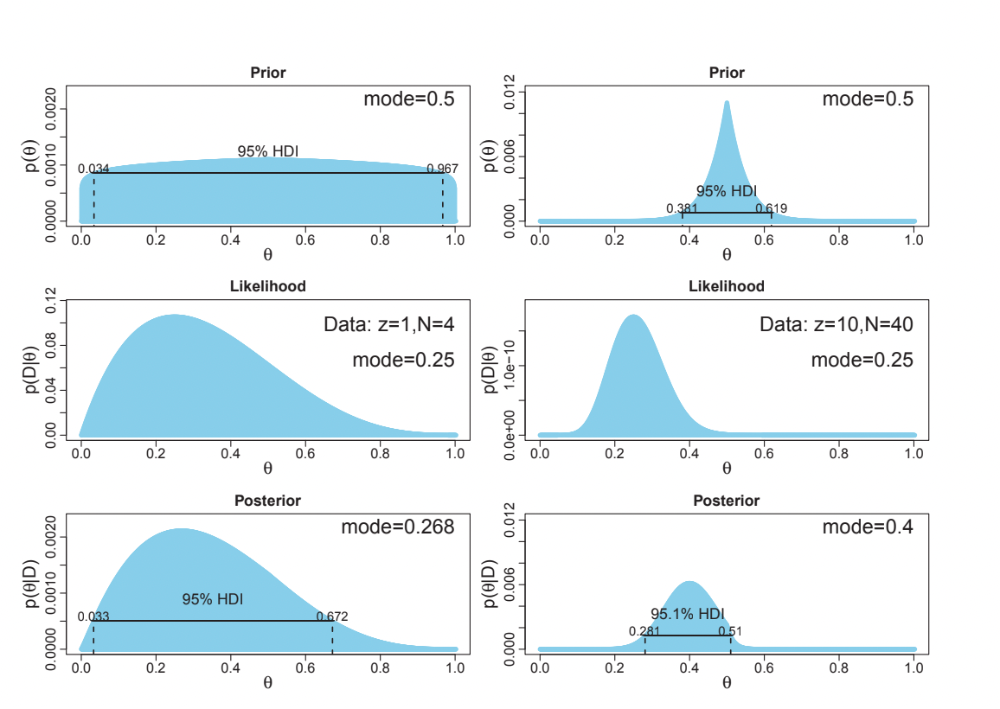<div>
Kruschke, J. K. (2014). Doing Bayesian Data Analysis

# Multivariate case and regularization

Now consider a multiple linear regression model
$$
y\sim {\cal N}(w^T x,\sigma^2).
$$
Again assume that $\sigma$ is known or independent on $w$, while for the components of the vector $w=(w_1,w_2,...w_n)$ the prior distributions are known to be pairwise independent normal distributions
$$
w_j\sim{\cal N}(w_j^*,\sigma_j^*).
$$

$$
p(w|Y,X)\sim p(Y|w,X)p(w)=p(w)\prod\limits_i p(y=y_i|w,x=x_i)p(w)=\prod_i p(y=y_i|w,x=x_i)\prod_j p(w_j)\sim 
$$
$$
\sim\prod\limits_i e^{\frac{-(y_i-w^T x_i)^2}{2\sigma^2}}\prod\limits_j e^{-\frac{(w_j-w_j^*)^2}{2(\sigma_i^*)^2}}=e^{-\frac{RSS(w)}{2\sigma^2}-\sum\limits_j \frac{(w_j-w_j^*)^2}{2(\sigma_i^*)^2}},
$$

so the estimate for the best fit $\hat{w}$ could be found from
$$
\hat{w}=argmax_w p(w|Y, X)=argmin_w\left[\frac{RSS(w)}{\sigma^2}+\sum\limits_j\frac{(w_j-w_j^*)^2}{(\sigma_j^*)^2}\right]\hspace{5ex}
$$

An important particular case of all the components of $w$ having the same prior $w_j\sim{\cal N}(0,\sigma/\sqrt{\lambda})$ leads to

$$
\hat{w}=argmin_w\left[RSS(w)+\lambda||w||_2^2\right]\hspace{5ex}(3)
$$

where $||w||_2=\sqrt{\sum\limits_j w_j^2}$, known as Ridge regression.

An alternative choice of the Laplacian prior distribution $p(w_j)\sim e^{-\lambda|w_j|/\sigma}$ leads to  
$$
\hat{w}=argmin_w\left[RSS(w)+\lambda||w||_1\right],\hspace{5ex}(4)
$$
where $||w||_1=\sum\limits_j |w_j|$, known as Lasso (least absolute shrinkage and selection operator) regression.

Both Ridge and Lasso could be shown to be equivalent to a constrained minimization of $RSS$:

$$
RSS(w)\to min, \ ||w||_p\leq \alpha,\hspace{5ex}(5)
$$

with $p=1,2$ respectively, although analytic relation between constants $\alpha$ and $\lambda$ is somewhat nontrivial. In practice however the choice of $\lambda$ or $\alpha$ is usually empirical anyway, so both regularized (i.e. (3)-(4) with adding a regularization term ||w||) or constrained forms (5) of the optimization problem are equally applicable.

Optimization problems (3) and (4) tend to minimize $RSS$ at the same time penalizing the regression for having $||w||$ too large (regularization) which often leads to the model complexity through multiple regressors with large coefficients canceling effect of each other. So in a sense Lasso and Ridge are trying to avoid this situation, looking for relatively simple "regular" models with best possible fit. 

Their Bayesian derivation show that Lasso and Ridge simply perform the regression with the prior belief that all the components of the $w$ are limited through the fixed variance of the priors. Such a belief affects the final outcome of the model making solutions with large $||w||$ to be particularly unlikely.

This helps Ridge and Lasso to fight overfitting also dealing with multicollinearity of regressors to some extent, preventing from learning noise through particularly complex "unnatural" combinations of the regressors.

Ridge regression admits solution in the closed form (consider partial derivatives of the objective function with respect to $w_j$):

$$
\hat{w}=(X^T X+\lambda I)^{-1}X^T Y, \hspace{5ex} (6)
$$

where $I$ is the identity $n\times n$ matrix, while $n$ being the number of regressors. The formulae (6) shows that the Ridge regression can in theory deal with the case of multicollinearity, when the matrix $X^T X$ is singular and OLS estimate does not exist.

Lasso does not admit solution in the closed form and requires numerical methods (like subgradient methods) to be fit. 
Lasso however has an advantage of being able to completely eliminate impact of certain irrelevant regressors setting the corresponding slope coefficients to zero.  

So the ability of the model to predict future values of $y$ depends (besides the irreducible error which we're not in control of) on both - the variance in our estimae of $\hat{w}$ as well as the bias in our estimation (i.e. systematic shift like under or overestimation) of the true values of $w$ and $y$. 

The OLS estimate in theory is known to be unbiased (tends to have zero bias provided that the training sample is large enough), however might have pretty high variance in $\hat{w}$ especially when the regressors are highly correlated. This reduces its generalizeability. Regularized regression, like Ridge and Lasso can introduce some bias (might not fit the training sample that well), but may largely reduce variance by limiting the $||w||$ (and become much less sensitive to small changes in the training data, reducing the risk of overfitting).

Generally, often the more complex model able to better learn from the training sample (lower bias) have higher variance, which leads to overfitting and high error for predicting the future values of the output variable.

## Estimating probability distributions through Markov Chain Monte Carlo (MCMC) simulation

Unlike the frequestist approach, the Bayesian approach provides a rigorous way to make probability statements about different variables in question. The approach is to summarize the entire posterior probability distribution, which is necessary to make probabilistic statements about real quantities of interest for data scientists. 

This undertaking is achieved through Markov Chain Monte Carlo (MCMC) simulation, and we will now show a popular MCMC algorithm (Gibbs algorithm) using the bivariate normal distribution.

We'll use the Gibbs sampler to simulate a joint normal distribution for two variables with known covariance. Gibb's sampler draws iteratively from posterior conditional distributions for each variable. Thus, essentially, we simulate the bivariate normal distribution by iteratively sampling values from conditional distributions of variables. Finally, we estimate the mean and covariance of the distribution obtained from Gibbs sampler.


Let's first demonstrate a theoretic bivariate normal distribution with unit variance

Text(0.5, 0.92, 'Bivariate Normal')

/Users/ryanng/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


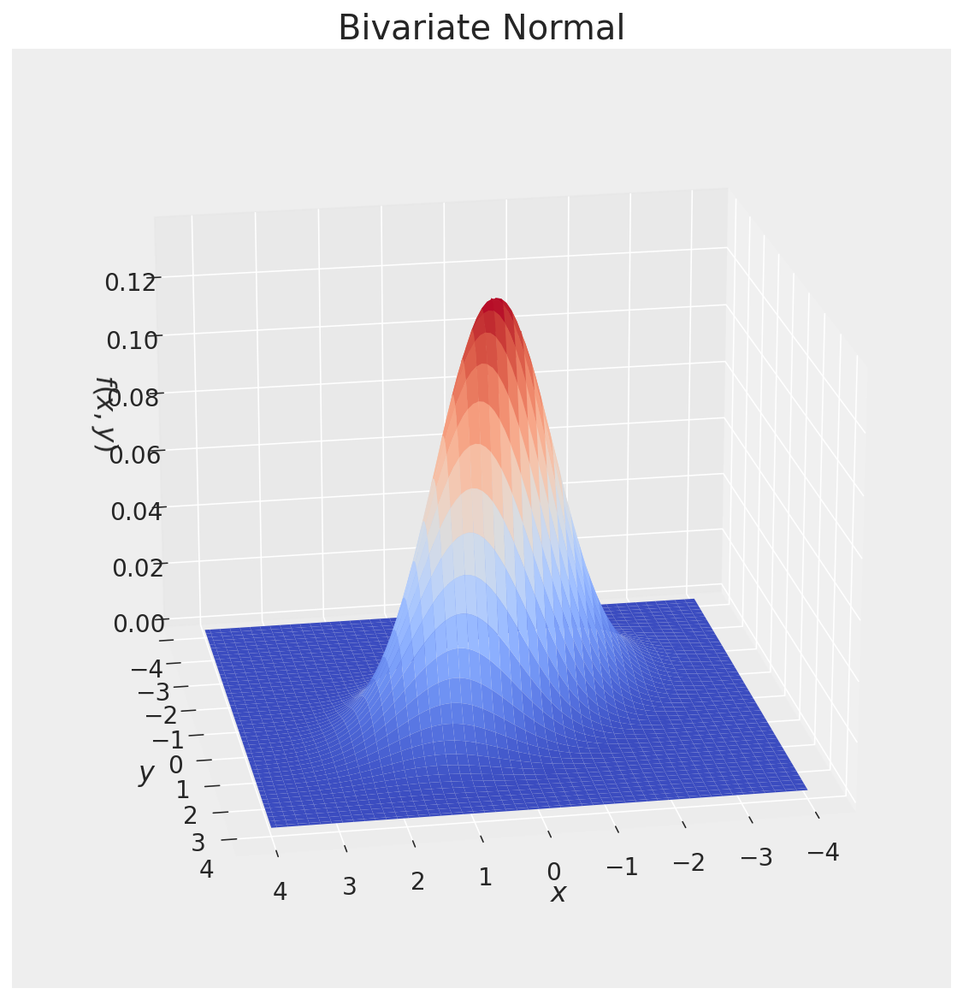

In [13]:
# joint bivariate normal distribution

import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D

x, y = np.linspace(-4, 4, 100), np.linspace(-4, 4, 100)
x, y = np.meshgrid(x, y)
z = np.mat(np.zeros(2))
p = np.zeros(np.shape(x))
R = np.matrix([[1, 0.5],[0.5, 1]]) # assign covariance as 0.5 between x, y
Rinv = np.linalg.inv(R)

for i in range(len(x)):
    for j in range(len(y)):
        z[0, 0] = x[i, j]
        z[0, 1] = y[i, j]
        p[i, j] = (1.0 / (2 * np.pi) * np.sqrt(np.linalg.det(R))) * np.exp(-(z * Rinv *z.T) / 2)

fig = plt.figure(figsize = (8, 8))
ax = fig.add_subplot(111, projection='3d')
#ax.plot_wireframe(x, y, p, rstride=3, cstride=3, color='#AD5300')
ax.plot_surface(x, y, p, rstride=2, cstride=2, cmap=cm.coolwarm, shade='interp')
#ax.plot_wireframe(x, y, p, rstride=3, cstride=3, color='black')
ax.view_init(20, 80) # rotation through 20, 40, 60, 80
ax.set_xlabel(r'$x$', fontsize = 16)
ax.set_ylabel(r'$y$', fontsize = 16)
ax.set_zlabel(r'$f(x, y)$', fontsize = 16)
ax.set_title(r'Bivariate Normal', fontsize = 20)


#### Notes

* The bluer the region, the less likely is it.  The redder the region, the more likely it is.
* Same can be observed in the contour slices of the distribution

Text(0.5, 1.0, 'Contour Slices of Bivariate Normal')

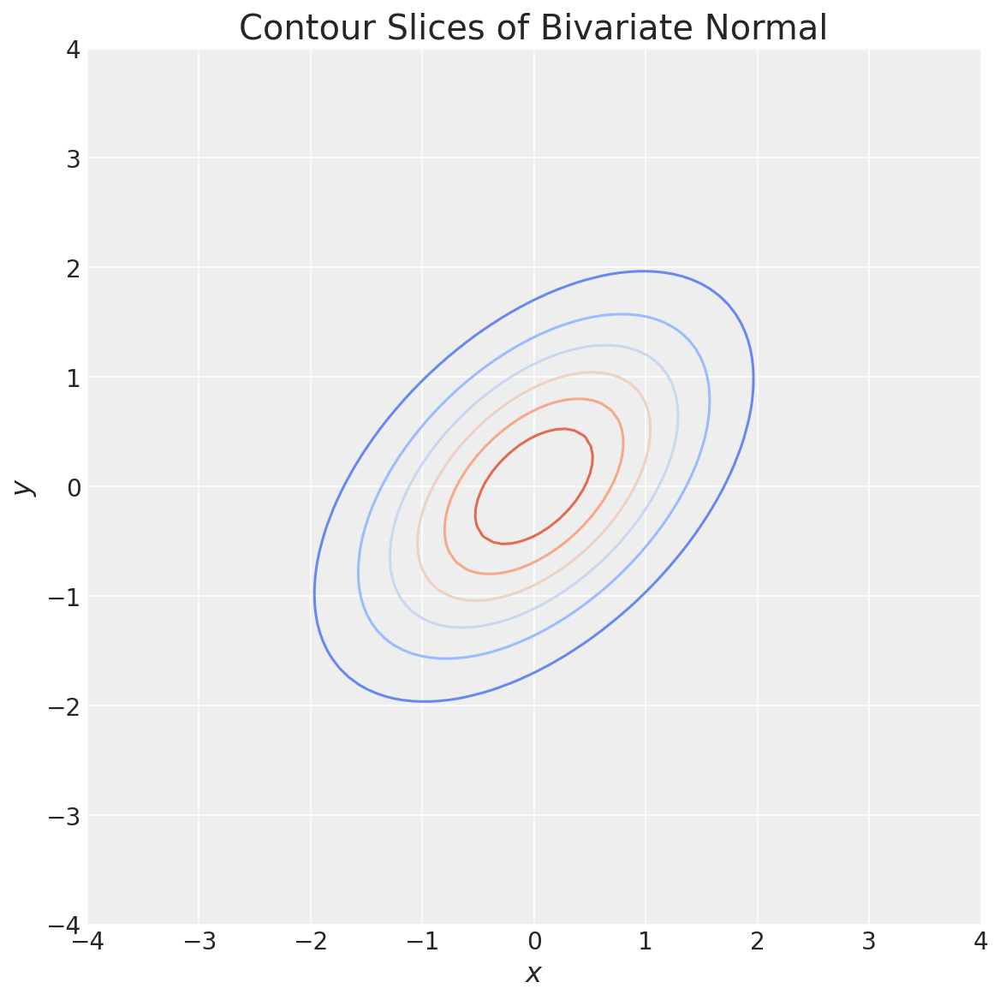

In [14]:
# contour plot
fig = plt.figure(figsize = (8, 8))
ax = fig.gca()
ax.contour(x, y, p, cmap=cm.coolwarm)  
ax.set_xlim(-4, 4)
ax.set_ylim(-4, 4)
ax.set_xlabel(r'$x$', fontsize = 16)
ax.set_ylabel(r'$y$', fontsize = 16)
ax.set_title(r'Contour Slices of Bivariate Normal', fontsize = 20)

## MCMC Simulation Using The Gibbs Algorithm 


* The Gibbs algorithm is a Markov chain Monte Carlo (MCMC) method to simulate a sequence of observations, as an approximation, when direct sampling is difficult. Direct sampling is complex in cases where joint distribution is not known explicitly. These cases generally arise when a particular parameter's prior is not conjugate with that parameter's likelihood (i.e. the posterior distribution does not belong to the same distribution family as the prior, i.e. normal posterior following normal prior), which could make estimation of distribution of posterior difficult and computationally intracable (e.g. no closed form analytic expression for the posterior).


#### The Gibbs algorithm steps:

The Gibbs sampler works by restructuring the joint estimation problem as a series of smaller, easier estimation problems. For example, consider the case where the parameter vector can be represented as: $\theta' = [\theta_{1}'\text{ }\theta_{2}']$, with joint distribution $p(\theta_{1}, \theta_{2})$

The bivariate general Gibbs Sampler  can be broken down into simple steps:

1. Set up sampler specifications including the number of iterations and the number of burn-ins draws (initial interations not used in final sampling but just to warm up the algorithm).
2. Choose a starting value $\theta_1^{(r)}$ with $r:=0$
3. Draw $\theta_2^{(r+1)}$ from $\:p(\theta_2|\:\theta_1^{(r)})$
4. Draw $\theta_1^{(r+1)}$ from $\:p(\theta_1|\:\theta_2^{(r+1)})$
5. Repeat 3-4 for desired number of iterations.
6. Final calculations including means, standard deviations and plots.
<div>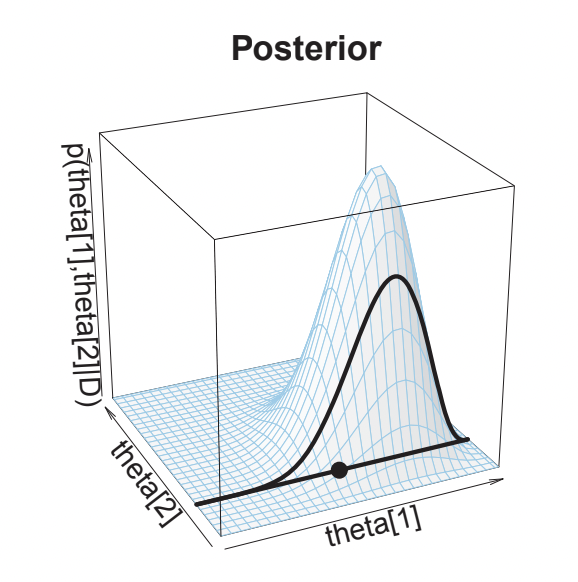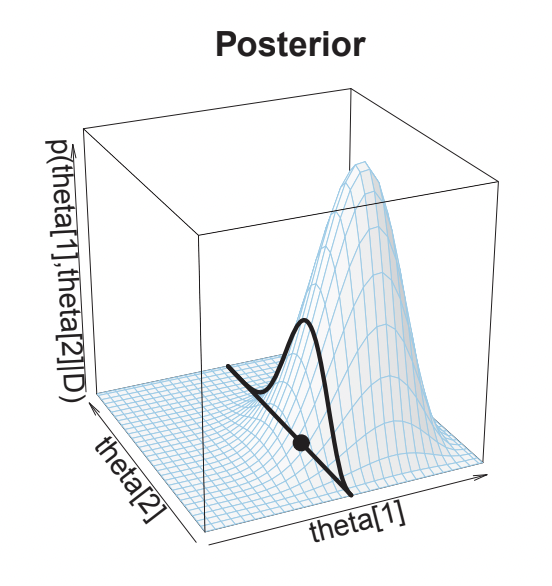</div>

###### Two steps in a Gibbs sampling: In the upper panel, the heavy lines show a slice through the posterior conditionalized on a particular value of θ2, and the large dot shows a random value of θ1 sampled from the conditional density. The lower panel shows a random generation of a value for θ2, conditional on the value for θ1 determined by the previous step. The heavy lines show a slice through the posterior at the conditional value of θ1, and the large dot shows the random value of θ2 sampled from the conditional density.

* The sequence geneated by this method can be used to approximate through historgrams:

    1. a joint distribution
    2. a marginal distribution of one of the variables
    3. an integral to be used to generate averages

* It is a simple method that makes use of random numbers that generates a Markov chain. 
* We need time for the Markov chain to converge to reasonable numbers, referred to as the "Burn In". 

Now we will initiate Gibbs algorithm to simulate the contour slices of a bivariate normal with $\rho = 0.5$. (covariance)

* Start the MCMC chain at an arbitrary starting value (-10, -10).
* Our results are not dependent on this artibrary starting value.
* In the code below, mc is the number of mcmc replications.
* start is the random starting point, (start, start).

In [15]:
mc = 10000 
start = -10
rho = .5

x = np.zeros(mc)
y = np.zeros(mc)  
x[0], y[0] = start, start

for i in range(2, mc): 
    x[i] = np.random.normal(loc = rho * y[i-1], scale = np.sqrt(1 - rho * rho), size=1) 
    y[i] = np.random.normal(loc = rho * x[i], scale = np.sqrt(1- rho * rho), size=1)

#### Notes
* We start the MCMC chain at an arbitrary point and follow its progression by connecting all the simulated points with a line.
* We want to see the simulated point "build up" throughout the support of the bivariate normal.

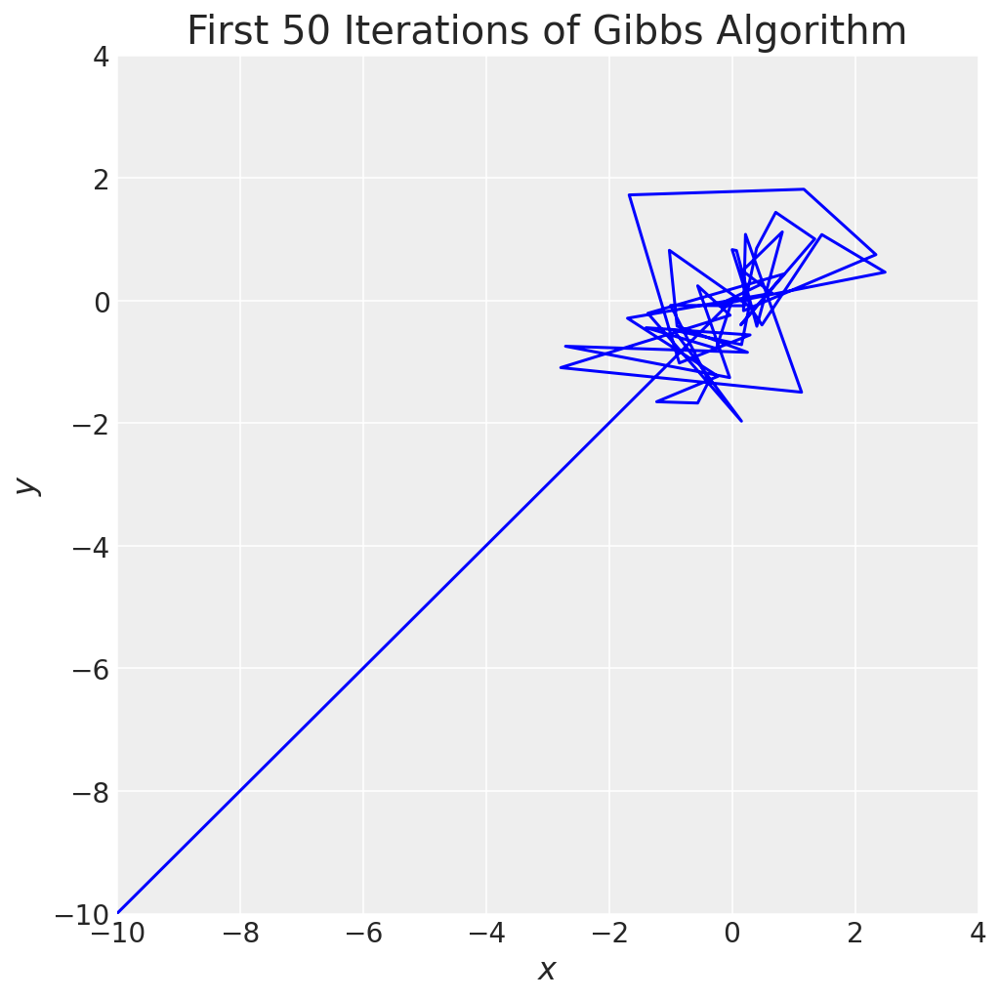

In [16]:
plt.figure(figsize = (7, 7))
plt.plot(x[0:49], y[0:49], 'b')
plt.xlim(-10,4)
plt.ylim(-10,4)
plt.xlabel(r'$x$', fontsize = 16)
plt.ylabel(r'$y$', fontsize = 16)
plt.title(r'First 50 Iterations of Gibbs Algorithm', fontsize = 20);

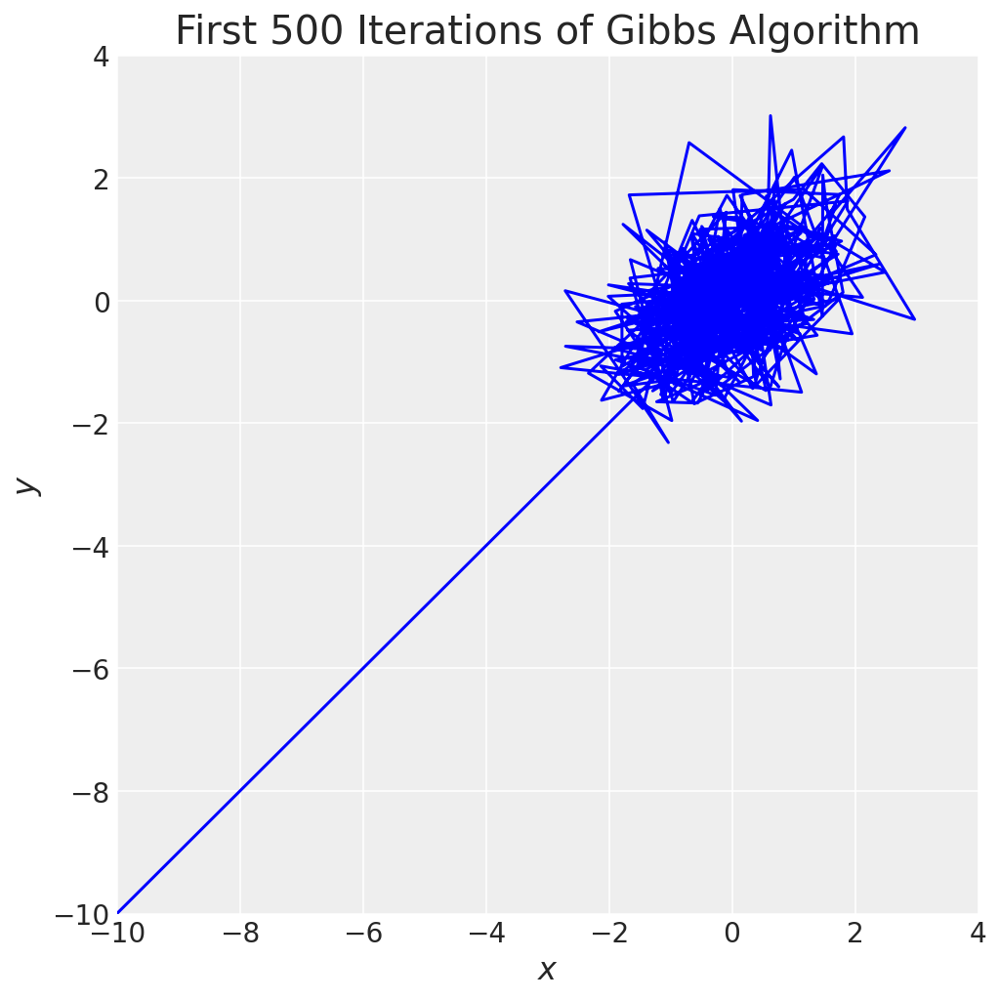

In [17]:
plt.figure(figsize = (7, 7))
plt.plot(x[0:499], y[0:499], 'b')
plt.xlim(-10,4)
plt.ylim(-10,4)
plt.xlabel(r'$x$', fontsize = 16)
plt.ylabel(r'$y$', fontsize = 16)
plt.title(r'First 500 Iterations of Gibbs Algorithm', fontsize = 20);

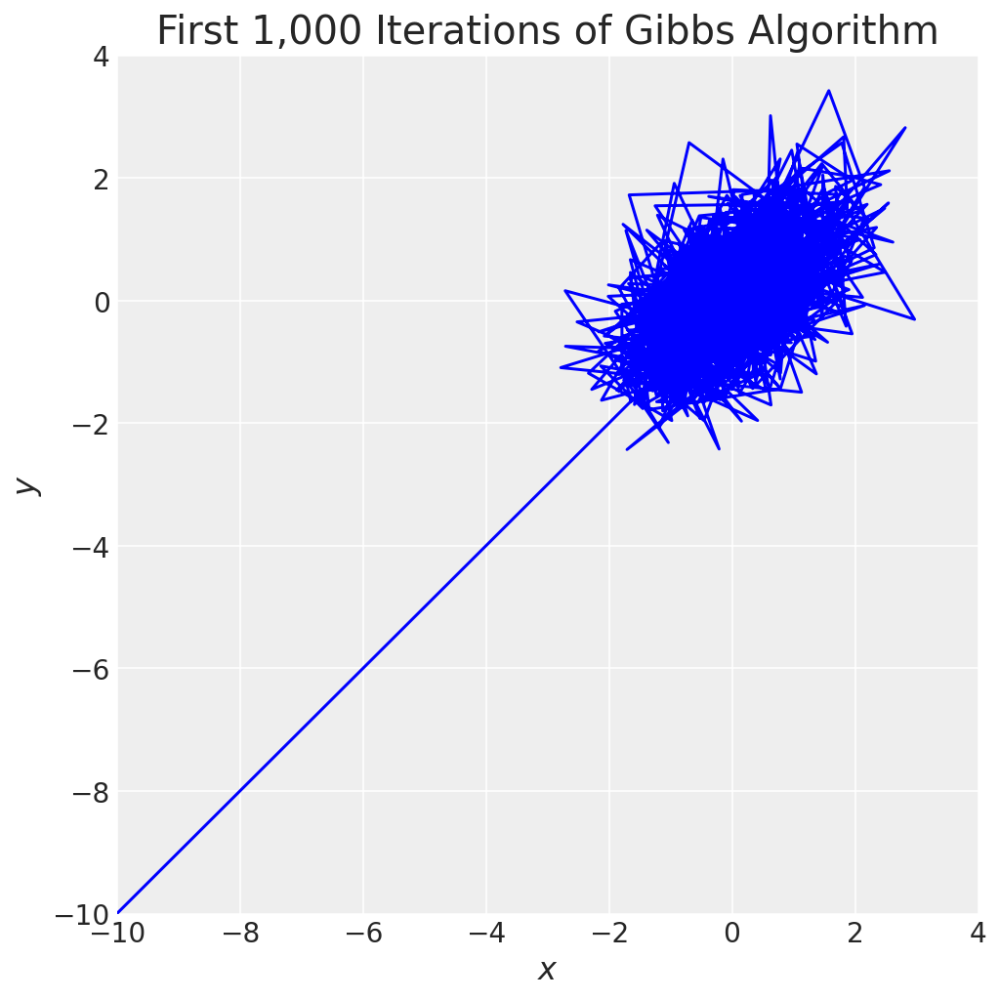

In [18]:
plt.figure(figsize = (7,7))
plt.plot(x[0:999], y[0:999], 'b')
plt.xlim(-10,4)
plt.ylim(-10,4)
plt.xlabel(r'$x$', fontsize = 16)
plt.ylabel(r'$y$', fontsize = 16)
plt.title(r'First 1,000 Iterations of Gibbs Algorithm', fontsize = 20);

#### Notes

* Treat the first 500 MCMC replications as the burn in and discard them.
* Generate a scatterplot of the remaining replications.
* Keeping in mind the bivariate normal, notice what is important in these MCMC replications.
    1. Their coverage is dense where the bivariate normal is most probable.
    2. It is sparse where the bivariate normal is the least probable.
* This is the the key to simulating a distribution function using MCMC.

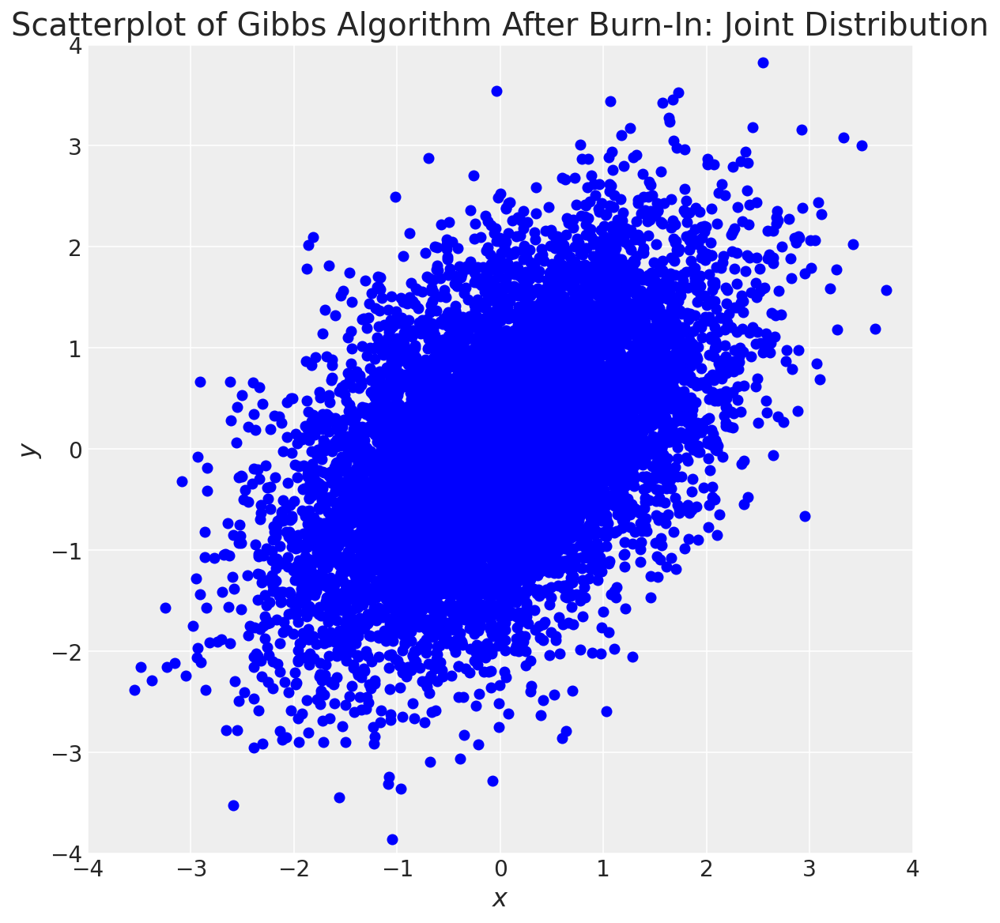

In [19]:
plt.figure(figsize = (8,8))
plt.scatter(x[499:9999], y[499:9999], c='b')
plt.xlim(-4, 4)
plt.ylim(-4 ,4)
plt.xlabel(r'$x$', fontsize = 16)
plt.ylabel(r'$y$', fontsize = 16)
plt.title(r'Scatterplot of Gibbs Algorithm After Burn-In: Joint Distribution', fontsize = 20);

#### Notes

* Having simulated the bivariate normal with the Gibbs algorithm, we can examine to key aspects discussed above. Calculate the average posterior together with 95% credible interval.
* We have basically recreated the univariate normal with mean zero and variance one.

The average is 0.011045
The 2.5 and 97.5 percentiles are -1.909456 and 1.983096


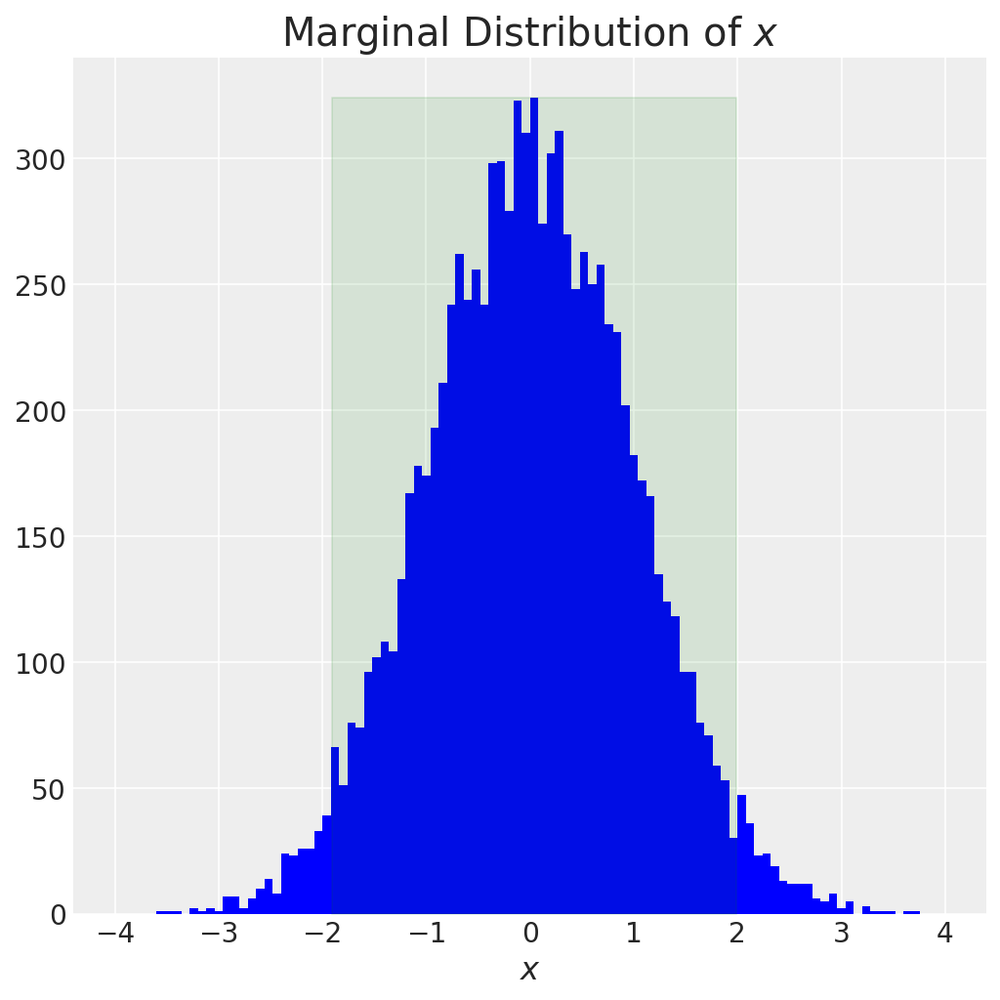

In [20]:
mean = x[499:9999].mean()
p2 = np.percentile(x[499:9999], 2.5)
p97 = np.percentile(x[499:9999], 97.5)

plt.figure(figsize = (7,7))
height, bins, patches = plt.hist(x[499:9999], bins=100, range=(-4, 4), color='b')
plt.fill_betweenx([0, height.max()], p2, p97, color='g', alpha=0.1) 
plt.xlabel(r'$x$', fontsize = 16)
plt.title(r'Marginal Distribution of $x$', fontsize = 20)

print("The average is %f" % mean)
print("The 2.5 and 97.5 percentiles are %f and %f" % (p2, p97))

The average is 0.020718
The 2.5 and 97.5 percentiles are -1.938847 and 2.022907


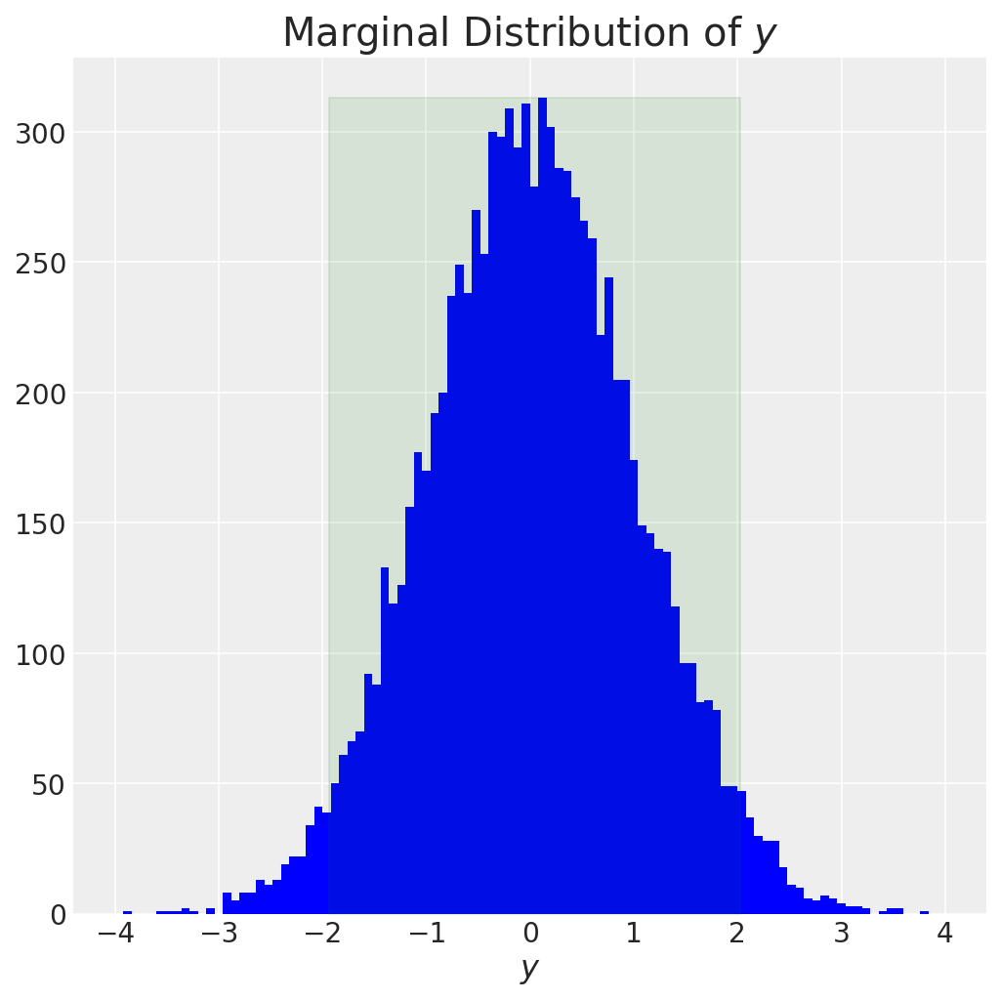

In [21]:
mean = y[499:9999].mean()
p2, p97 = np.percentile(y[499:9999], 2.5), np.percentile(y[499:9999], 97.5)

plt.figure(figsize = (7,7))
height, bins, patches = plt.hist(y[499:9999], bins=100, range=(-4, 4), color='b')
plt.fill_betweenx([0, height.max()], p2, p97, color='g', alpha=0.1) 
plt.xlabel(r'$y$', fontsize = 16)
plt.title(r'Marginal Distribution of $y$', fontsize = 20)

print("The average is %f" % mean)
print("The 2.5 and 97.5 percentiles are %f and %f" % (p2, p97))

In [22]:
%%html
<iframe src="https://chi-feng.github.io/mcmc-demo/app.html?algorithm=GibbsSampling&target=banana" width="1000" height="500"></iframe>

Using Gibb's sampling, we have estimated the joint distribution of x and y as well as their marginal distributions. Essentially, we have re-created the bivariate normal distribution described before through sampling x and y points iteratively from their conditional distributions, which is the essence of Gibb's sampling.

## Estimating distributions of coefficients in linear regression with MCMC sampling

We now show a regression case and estimate the posterior distributions of variable coefficients from the data.

Here we take information of multiple persons' body characteristics, their daily exercise duration (in minutes) and the corresponding calories burned by them duration the exercise. The body characteristics present in the data are: Gender, Age, Height (cm), Weight (kg), Heart Rate (bpm) and Body Temperature (celsius). Each person is reference by a unique ID (denoted by user_id). In total, we take 500 unique data points.

Along with the duration, body characteristics can play roles in the amount of calories a person burns during the exercise. We are interested in creating a linear model for estimating the amount of calories burned with the exercise duration and different body characteristics as predictors.

In [23]:
# read the data files

exercise = pd.read_csv('exercise.csv')
calories = pd.read_csv('calories.csv')
df = pd.merge(exercise, calories, on = 'User_ID')
df = df[df['Calories'] < 300]
df = df.sample(500, random_state=2002)
df = df.reset_index()
df.head()

,index,User_ID,Gender,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories
0,11600,12638994,female,25,173.0,69.0,29.0,117.0,41.0,207.0
1,8467,15045105,female,38,162.0,62.0,20.0,94.0,40.3,100.0
2,3719,15529573,male,29,178.0,81.0,28.0,106.0,40.9,167.0
3,14508,16230503,female,50,155.0,57.0,9.0,97.0,39.8,50.0
4,13061,16641757,male,28,181.0,80.0,19.0,105.0,40.2,109.0


/Users/ryanng/opt/anaconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/ryanng/opt/anaconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


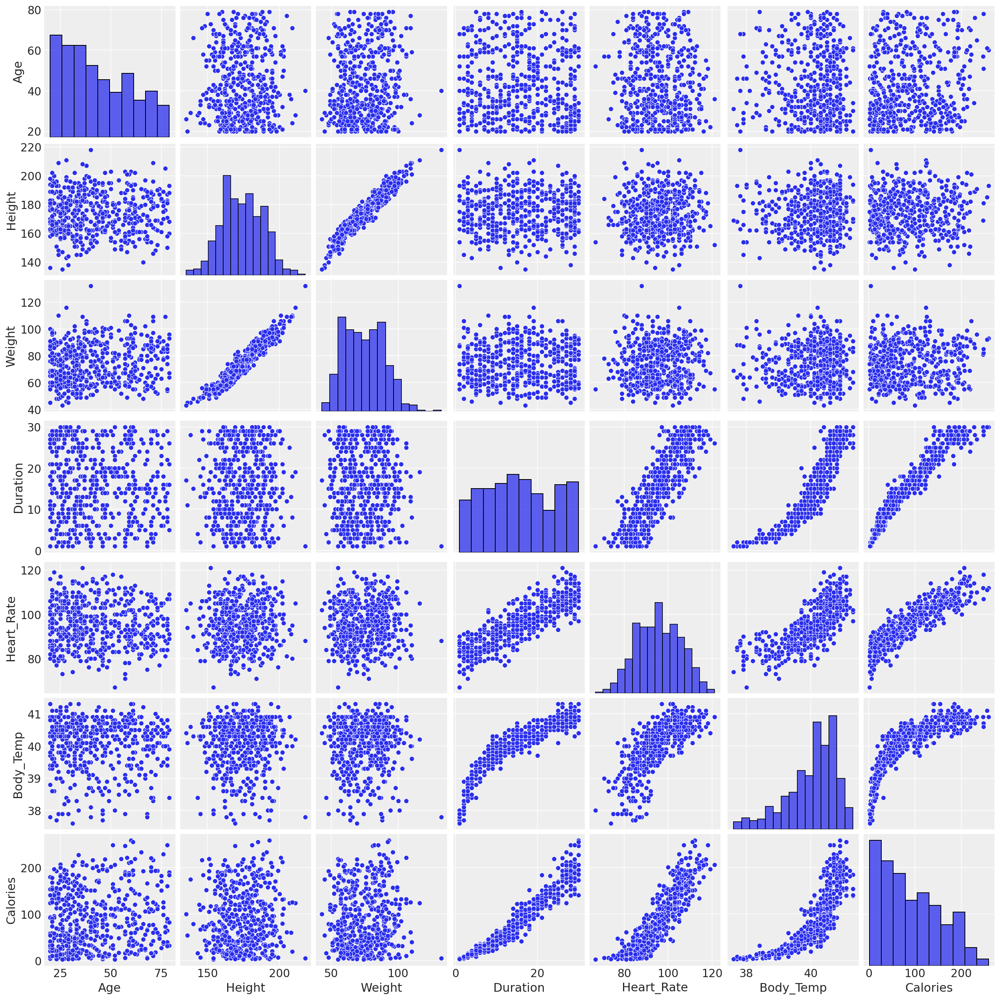

In [24]:
# exploratory scatter plot of continuous variables

sns.pairplot(df.iloc[:, 3:]);


We are interested in predicting the amount of calories burned based on body characteristics and excercise duration as predictors. 

Let's first implement a univariate regression taking just one variable (excercise duration) and estimate the posterior distributions of coefficients. 

In [25]:
## univariate regression 

formula = 'Calories ~ ' + df.columns.values[6]
formula

'Calories ~ Duration'

## Initialize model parameters' prior distributions and estimate posterior distributions with MCMC simulations

We'll use PyMC3, a popular Python library for Bayesian inference with MCMC simulation. It allows to construct probabilistic models operating random variables with known prior distribution and estimate the posterior of the Bayesian inference.

In more specific terms, the formula for univariate regression is ŷ(x) = 𝛼 + 𝛽 · x , where 𝛼 is intercept and 𝛽 is slope coefficient - we'll introduce them as random variables to simulate using selected priors

We assume that the parameters are distributed in a certain way (priors). We take the intercept and slope (coefficient of 'duration' variable) are normally distributed; a slope averages around 7.5 (average calory burn per minute for average person with average excercise activity) and standard deviation of 5, for the intercept (calories in transition to/from the excercise) with mean 15 and a standard deviation of 5.

For the likelihood, we assume a normal distribution with a mean of ŷ(x) and a uniformly distributed standard deviation between 0 and 10.

In [26]:
with pm.Model() as linear_model:
    x = df['Duration']
    y = df['Calories']

    # Intercept prior
    intercept = pm.Normal('Intercept', mu = 15, sd = 5)
    
    # Slope prior
    slope = pm.Normal('slope', mu = 7.5, sd = 5)
    
    # Standard deviation prior
    sigma = pm.HalfNormal('sigma', sd = 10)
    
    # y_est is the specification of the Bayesian model (here linear regression) to be estimated.
    y_est = intercept + slope * x
    
    # define likelihood
    likelihood = pm.Normal('Y_obs', mu = y_est, sd = sigma, observed = y)
    
    # MCMC sampling
    # We use the Maximum a Posteriori (MAP) values as starting values for the MCMC sampling.
    start = pm.find_MAP()
    trace1 = pm.sample(1000, start=start, progressbar=True)

/var/folders/mq/85gqchqx0zgg03bk5c8gqjpr0000gn/T/ipykernel_10062/1956142963.py:23: DeprecationWarning: Call to deprecated Parameter start. (renamed to `initvals` in PyMC v4.0.0) -- Deprecated since v3.11.5.
  trace1 = pm.sample(1000, start=start, progressbar=True)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, slope, Intercept]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 18 seconds.


In [27]:
pm.model_to_graphviz(linear_model)

ExecutableNotFound: failed to execute PosixPath('dot'), make sure the Graphviz executables are on your systems' PATH

PyMc3 model functions details:

- find_MAP finds the starting point for the sampling algorithm by deriving the local maximum a posteriori point.
- NUTS implements the MCMC sampling algorithm given the assumed priors.
- sample draws a number of samples given the starting value from find_MAP and the optimal step size from the NUTS algorithm.

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,-17.79,1.69,-20.73,-14.43,0.04,0.03,1659.64,1485.55,1.0
slope,7.02,0.10,6.84,7.20,0.00,0.00,1677.78,1538.70,1.0
sigma,17.96,0.58,16.89,19.04,0.01,0.01,2580.11,2159.70,1.0


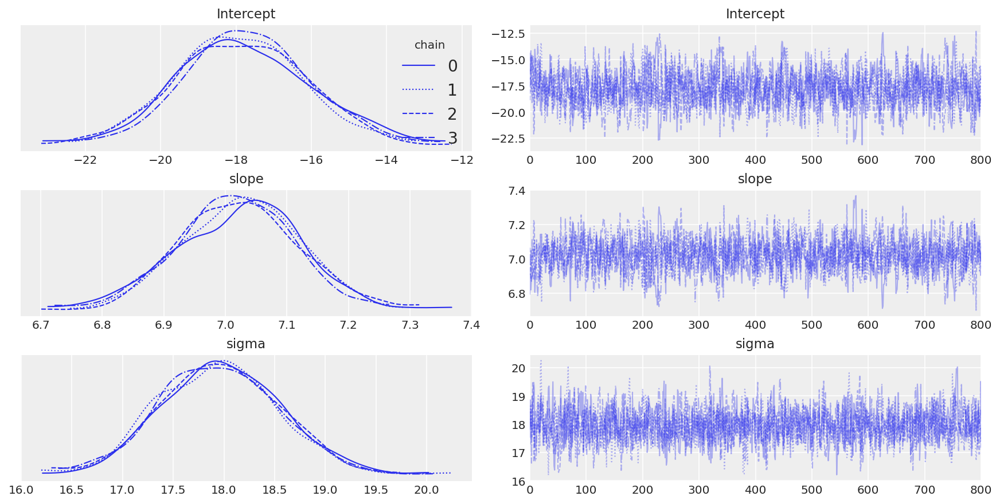

<Figure size 720x720 with 0 Axes>

In [28]:
# Show results after burn in of 200 MCMC replications.

with linear_model:
    az.plot_trace(trace1[199:1000], compact=True, combined=False, legend=True)
    plt.figure(figsize = (10, 10))
    display(az.summary(trace1, round_to=2));

In [29]:
# check mean of slope
np.mean(trace1['slope'])

7.020537101593387

The left side of the traceplot is the marginal posterior distributions of model parameters: the values for the variable are on the x-axis with the probability for the variable (as determined by sampling) on the y-axis. The different colored lines indicate that we performed four chains of Markov Chain Monte Carlo. From the left side we can see that there is a range of values for each weight. The right side shows the different sample values drawn as the sampling process runs.

In [30]:
# let's try with narrow priors

with pm.Model() as linear_model:
    x = df['Duration']
    y = df['Calories']
    
    # Intercept prior
    intercept = pm.Normal('Intercept', mu = 15, sd = 1)
    
    # Slope prior
    slope = pm.Normal('slope', mu = 7.5, sd = 1)
    
    # Standard deviation prior
    sigma = pm.HalfNormal('sigma', sd = 10)
    
    # y_est is the specification of the Bayesian model (here linear regression) to be estimated.
    y_est = intercept + slope * x
    
    # define likelihood
    likelihood = pm.Normal('Y_obs', mu = y_est, sd = sigma, observed = y)
    
    # MCMC sampling
    # We use the Maximum a Posteriori (MAP) values as starting values for the MCMC sampling.
    start = pm.find_MAP()
    trace2 = pm.sample(1000, start=start, progressbar=True)

/var/folders/mq/85gqchqx0zgg03bk5c8gqjpr0000gn/T/ipykernel_10062/791225159.py:25: DeprecationWarning: Call to deprecated Parameter start. (renamed to `initvals` in PyMC v4.0.0) -- Deprecated since v3.11.5.
  trace2 = pm.sample(1000, start=start, progressbar=True)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...


Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, slope, Intercept]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 17 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,8.38,1.00,6.52,10.20,0.02,0.02,1859.90,2618.64,1.0
slope,5.73,0.08,5.59,5.87,0.00,0.00,1887.05,2327.95,1.0
sigma,22.78,0.78,21.40,24.30,0.02,0.01,2340.29,2551.62,1.0


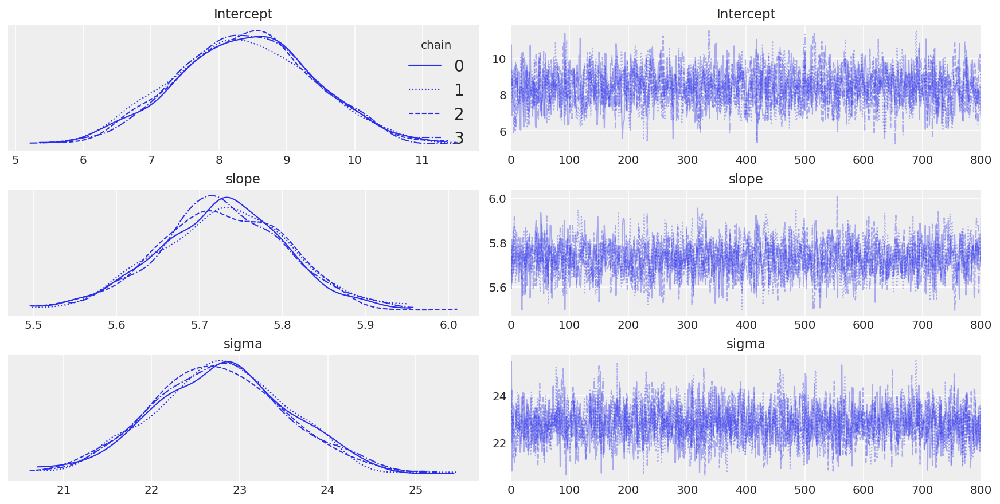

<Figure size 720x720 with 0 Axes>

In [31]:
# Show results after burn in of 200 MCMC replications.

with linear_model:
    az.plot_trace(trace2[199:1000], compact=True, combined=False, legend=True)
    plt.figure(figsize = (10, 10))
    display(az.summary(trace2, round_to=2));

In [32]:
# check mean of slope
np.mean(trace2['slope'])

5.728666622449597

Notice the mean slope change while the intercepe flipped dramatically positive while sigma increased.

Let's try with a uniform parameter distribution with low=2 and high=15. It would signify that we know that we burn between 2 (sleep) and 15 (super intense workout) calories per minute.

In [33]:
with pm.Model() as linear_model:
    x = df['Duration']
    y = df['Calories']

    # Intercept prior
    
    intercept = pm.Normal('Intercept', mu = 15, sd = 2)
    
    # Slope prior
    slope = pm.Uniform('slope', lower=2, upper=15)
    
    # Standard deviation prior
    sigma = pm.HalfNormal('sigma', sd = 10)
    
    # y_est is the specification of the Bayesian model (here linear regression) to be estimated.
    y_est = intercept + slope * x
    
    # define likelihood
    likelihood = pm.Normal('Y_obs', mu = y_est, sd = sigma, observed = y)
    
    # MCMC sampling
    # We use the Maximum a Posteriori (MAP) values as starting values for the MCMC sampling.
    start = pm.find_MAP()
    trace3 = pm.sample(1000, start=start, progressbar=True)

/var/folders/mq/85gqchqx0zgg03bk5c8gqjpr0000gn/T/ipykernel_10062/229607498.py:24: DeprecationWarning: Call to deprecated Parameter start. (renamed to `initvals` in PyMC v4.0.0) -- Deprecated since v3.11.5.
  trace3 = pm.sample(1000, start=start, progressbar=True)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...


Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, slope, Intercept]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 18 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,-4.82,1.51,-7.65,-2.01,0.04,0.03,1578.57,1671.14,1.0
slope,6.38,0.09,6.21,6.55,0.00,0.00,1503.70,1493.97,1.0
sigma,19.53,0.70,18.21,20.81,0.02,0.01,1944.56,2184.80,1.0


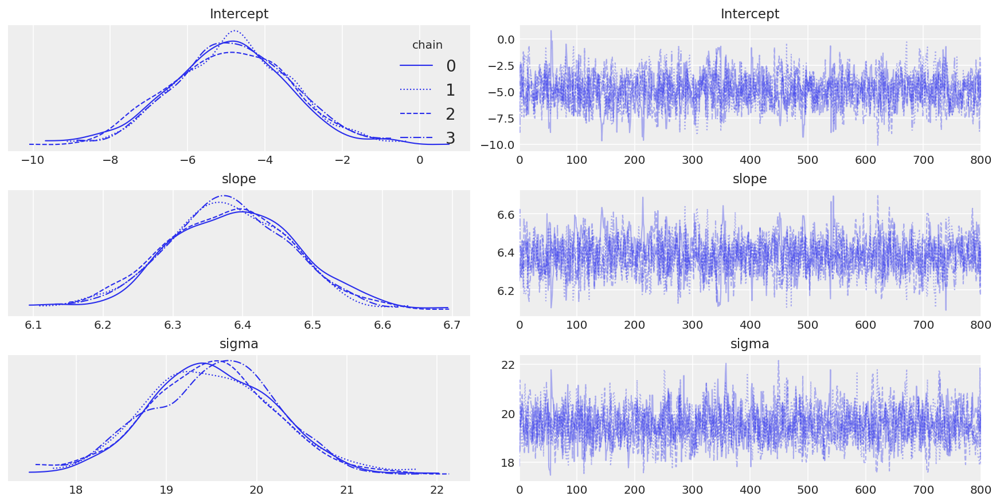

<Figure size 720x720 with 0 Axes>

In [34]:
# Show results after burn in of 200 MCMC replications.

with linear_model:
    az.plot_trace(trace3[199:1000], compact=True, combined=False, legend=True)
    plt.figure(figsize = (10, 10))
    display(az.summary(trace3, round_to=2));

In [35]:
np.mean(trace3['slope'])

6.377639690574656

The slope and intercept reverted back towards the first round, but less extreme.

## plot posterior distributions of model parameters

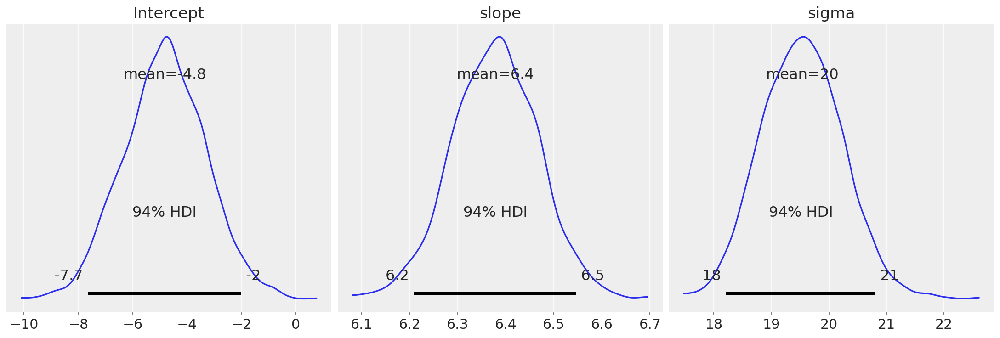

In [36]:
with linear_model:
    pm.plot_posterior(trace3, figsize = (15,5), textsize = 15);

In [37]:
# check parameters with linear regression

X = sm.add_constant(np.array(df[['Duration']]))
y = np.array(df[['Calories']])
lr = sm.OLS(y, X).fit()
print('slope: ', lr.params[1], 'intercept: ', lr.params[0])
print('95% confidence interval: ', 'slope: ', lr.conf_int(alpha=0.05, cols=None)[1], 
      'intercept: ', lr.conf_int(alpha=0.05, cols=None)[0])

slope:  7.204627086367095 intercept:  -21.511456580708646
95% confidence interval:  slope:  [7.0185976  7.39065657] intercept:  [-24.81380216 -18.209111  ]


the parameters estimated by linear regression are roughly the same as mean of posterior distributions estimated from above with Normal priors and broad variance

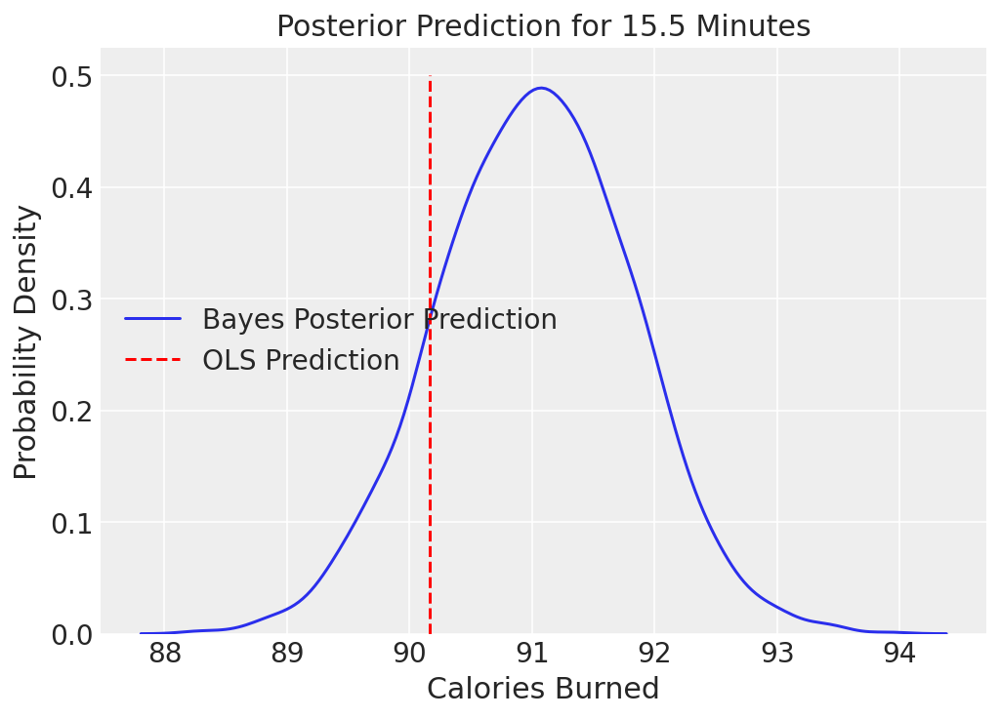

In [38]:
# posterior distribution for one data point (duration = 15.5 minutes)

bayes_prediction = trace1['Intercept'] + trace1['slope'] * 15.5
plt.figure(figsize = (7, 5))
#plt.style.use('fivethirtyeight')
sns.kdeplot(bayes_prediction, label = 'Bayes Posterior Prediction')
plt.vlines(x = -21.511456580708646 + 7.204627086* 15.5, 
           ymin = 0, ymax = 0.5, 
           label = 'OLS Prediction',
          colors = 'red', linestyles='--')

plt.legend();
plt.xlabel('Calories Burned', size = 15), plt.ylabel('Probability Density', size = 15);
plt.title('Posterior Prediction for 15.5 Minutes', size = 15);

### How Do the Priors Affect the Posteriors?

Let's take a different set of priors and see how the posterior distributions change.

In the last case, we took "flat" priors for the parameters. Here, let's assume somewhat "narrow" normal distributions with standard deviation of 2 for intercept and slope.

Priors can be initialized based on different distributions. In case of normal distributions, flat priors (large std) usually implies no/little knowledge by us about the model parameters. Initializing flat priors means we don't want the posterior distributions be largely affected by our prior beliefs, allowing the posterior distributions to be driven mostly by obersved data. The opposite is true in case of narrow priors, which means we have strong assumptions about model parameters. For instance, if we have strong assumptions about the impact of exercise duration, the 'slope' coefficient prior should have a low std.

In [39]:
with pm.Model() as linear_model:
    x = df['Duration']
    y = df['Calories']
    
    # Intercept prior
    intercept = pm.Normal('Intercept', mu = 0, sd = 2)
    
    # Slope prior
    slope = pm.Normal('slope', mu = 0, sd = 2)
    
    # Standard deviation prior
    sigma = pm.HalfNormal('sigma', sd = 10)
    
    # y_est is the specification of the Bayesian model (here linear regression) to be estimated.
    y_est = intercept + slope * x
    
    # define likelihood
    likelihood = pm.Normal('Y_obs', mu = y_est, sd = sigma, observed = y)
    
    # MCMC sampling
    # We use the Maximum a Posteriori (MAP) values as starting values for the MCMC sampling.
    start = pm.find_MAP()
    trace = pm.sample(1000, start=start, progressbar=True)

/var/folders/mq/85gqchqx0zgg03bk5c8gqjpr0000gn/T/ipykernel_10062/1908310082.py:23: DeprecationWarning: Call to deprecated Parameter start. (renamed to `initvals` in PyMC v4.0.0) -- Deprecated since v3.11.5.
  trace = pm.sample(1000, start=start, progressbar=True)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, slope, Intercept]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 19 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,-12.17,1.37,-14.80,-9.73,0.03,0.02,1706.74,2040.64,1.0
slope,6.74,0.08,6.58,6.89,0.00,0.00,1809.16,2033.22,1.0
sigma,18.39,0.62,17.25,19.57,0.01,0.01,1924.67,2115.93,1.0


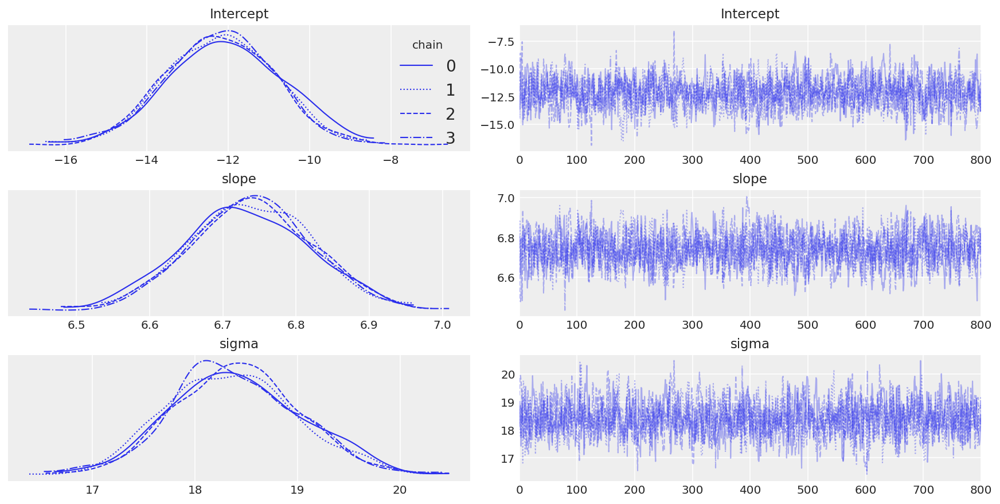

<Figure size 720x720 with 0 Axes>

In [40]:
# Show results after burn in of 200 MCMC replications.

with linear_model:
    az.plot_trace(trace[199:1000], compact=True, combined=False, legend=True)
    plt.figure(figsize = (10, 10))
    display(az.summary(trace, round_to=2));

Observe that the distributions of parameters change somewhat here, demonstrating that posterior distributions are driven by both prior and observed data.

Note: "Narrow" priors usually correspond to strong set of prior beliefs about the data before even observing it. If we don't have any information/strong assumptions about the data, we usually take "flat" priors and let the estimation of distributions be dependent mostly on observed samples.

## Implement multivariate regression with MCMC sampling for above data 
Take 'Age, Height, Weight, Duration, Heart_Rate, Body_Temp' variables as regressors and 'calories' as target variabel. Plot the posterior distributions of model parameters.


In [41]:
## mutivariate regression

formula = 'Calories ~ ' + ' + '.join(['%s' % variable for variable in df.columns[3:-1]])
formula

'Calories ~ Age + Height + Weight + Duration + Heart_Rate + Body_Temp'

In [42]:
# posterior estimation with MCMC sampling

with pm.Model() as normal_model:    
    y = df['Calories']
 
    # The prior for the model parameters
    alpha = pm.Normal('alpha', mu=0, sd=20)
    beta1 = pm.Normal('age', mu=0, sd=20) 
    beta2 = pm.Normal('height', mu=0, sd=20)
    beta3 = pm.Normal('weight', mu=0, sd=20)
    beta4 = pm.Normal('duration', mu=7.5, sd=3)
    beta5 = pm.Normal('heart rate', mu=0, sd=20)
    beta6 = pm.Normal('body temp', mu=0, sd=20)
    sigma = pm.HalfNormal('sigma', sd=10)
    
    # Creating the model requires a formula and data (and optionally a family)
    mean = alpha + beta1 * df['Age'] + beta2 * df['Height'] + beta3 * df['Weight'] + beta4 * df['Duration'] + beta5 * df['Heart_Rate'] + beta6 * df['Body_Temp']
    
    # Observed values
    Y_obs = pm.Normal('Y_obs', mu = mean, sd = sigma, observed = y)
    
    # MCMC sampling
    # We use the Maximum a Posteriori (MAP) values as starting values for the MCMC sampling.
    start = pm.find_MAP()
    trace = pm.sample(1000, start=start, progressbar=True)

/var/folders/mq/85gqchqx0zgg03bk5c8gqjpr0000gn/T/ipykernel_10062/1876521707.py:25: DeprecationWarning: Call to deprecated Parameter start. (renamed to `initvals` in PyMC v4.0.0) -- Deprecated since v3.11.5.
  trace = pm.sample(1000, start=start, progressbar=True)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, body temp, heart rate, duration, weight, height, age, alpha]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 56 seconds.
There were 474 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.654158391102378, but should be close to 0.8. Try to increase the number of tuning steps.
There were 12 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.2 for some parameters.
The estimated number of effective samples is smaller than 200 for some parameters.


/Users/ryanng/opt/anaconda3/lib/python3.9/site-packages/arviz/data/io_pymc3_3x.py:347: UserWarning: Could not compute log_likelihood, it will be omitted. Check your model object or set log_likelihood=False
  warnings.warn(warn_msg)
/Users/ryanng/opt/anaconda3/lib/python3.9/site-packages/arviz/data/io_pymc3_3x.py:347: UserWarning: Could not compute log_likelihood, it will be omitted. Check your model object or set log_likelihood=False
  warnings.warn(warn_msg)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,44.58,17.83,12.12,81.23,0.42,0.65,1448.06,2072.89,1.07
age,0.51,0.03,0.45,0.56,0.00,0.00,47.48,1893.61,1.06
height,0.02,0.12,-0.22,0.27,0.00,0.01,1764.93,1975.75,1.08
weight,0.03,0.12,-0.20,0.27,0.00,0.01,1722.51,2038.45,1.08
duration,5.78,0.12,5.58,6.02,0.01,0.01,108.17,299.30,1.05
heart rate,2.00,0.10,1.81,2.18,0.01,0.01,63.11,219.22,1.05
body temp,-6.59,0.58,-7.70,-5.45,0.01,0.01,1600.44,1781.25,1.12
sigma,11.66,0.43,10.79,12.33,0.13,0.09,12.02,20.18,1.24


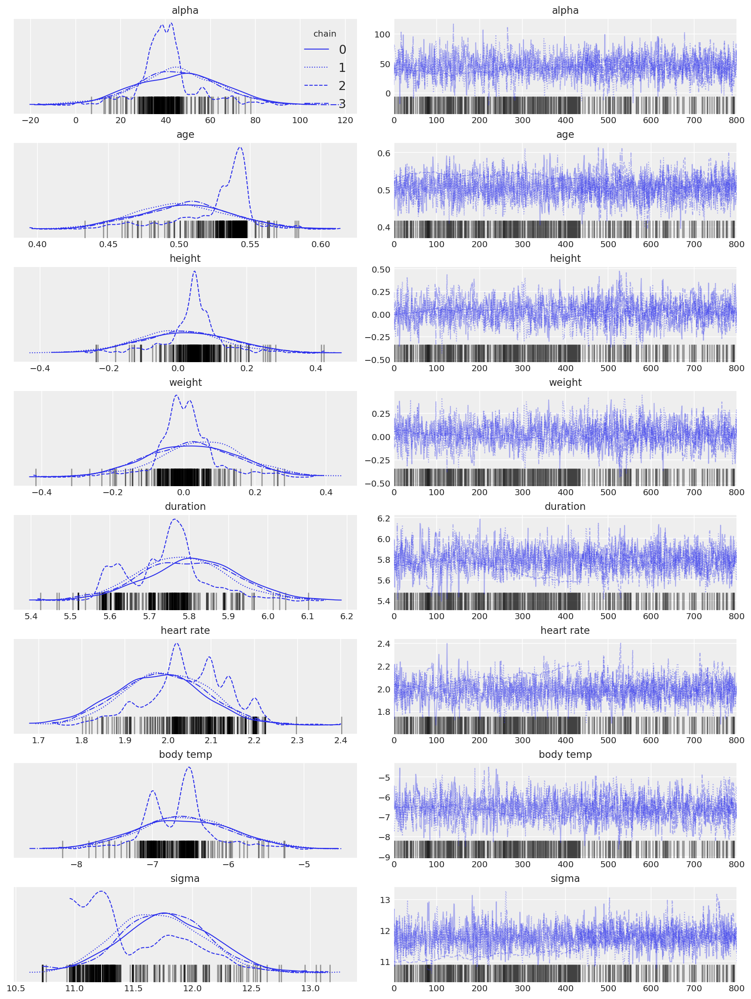

<Figure size 720x720 with 0 Axes>

In [43]:
with linear_model:
    az.plot_trace(trace[199:1000], compact=True, combined=False, legend=True)
    plt.figure(figsize = (10, 10))
    display(az.summary(trace, round_to=2));

/Users/ryanng/opt/anaconda3/lib/python3.9/site-packages/arviz/data/io_pymc3_3x.py:347: UserWarning: Could not compute log_likelihood, it will be omitted. Check your model object or set log_likelihood=False
  warnings.warn(warn_msg)


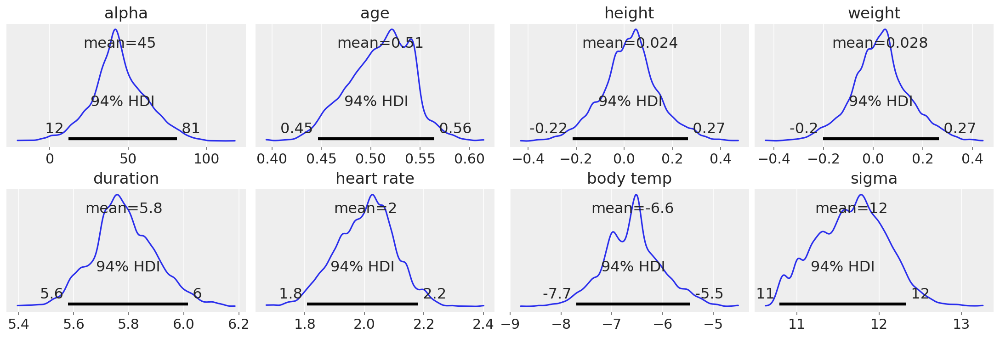

In [44]:
with linear_model:
    pm.plot_posterior(trace, figsize = (15,5), textsize = 15);

In [45]:
## Linear Formula from Bayesian Inference using Mean of Parameters

model_formula = 'Calories = '
for variable in trace.varnames:
    model_formula += ' %0.2f * %s +' % (np.mean(trace[variable]), variable)

' '.join(model_formula.split(' ')[:-1])

'Calories =  44.58 * alpha + 0.51 * age + 0.02 * height + 0.03 * weight + 5.78 * duration + 2.00 * heart rate + -6.59 * body temp + 2.46 * sigma_log__ + 11.66 * sigma'


<br>
<hr style="border:14px dark blue"> </hr>

# Other Cool Stuff with PyMC3

## Switch Point Analysis
##### Mining Disasters in the UK 1851 - 1962:  locate a period of time when disasters dropped more so than any other 

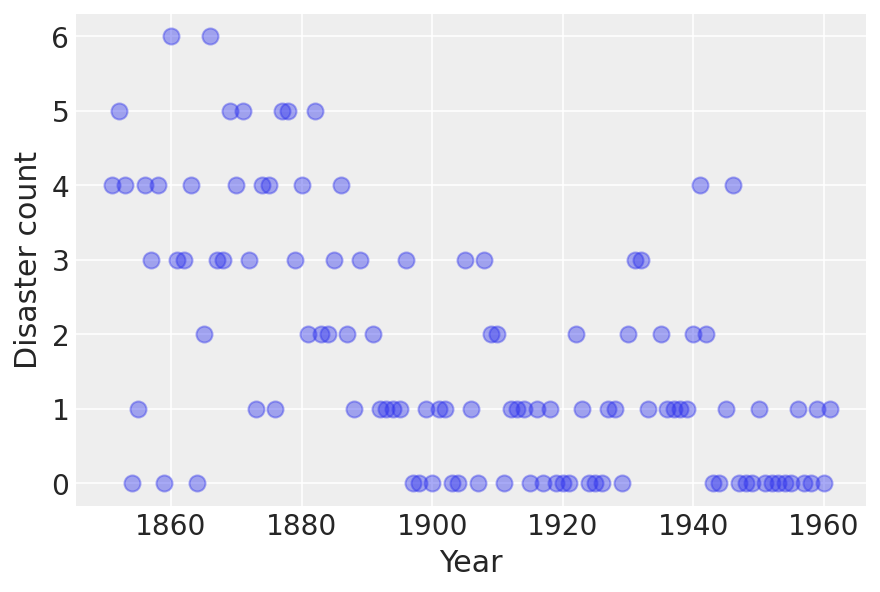

In [46]:
# fmt: off
disaster_data = pd.Series(
    [4, 5, 4, 0, 1, 4, 3, 4, 0, 6, 3, 3, 4, 0, 2, 6,
    3, 3, 5, 4, 5, 3, 1, 4, 4, 1, 5, 5, 3, 4, 2, 5,
    2, 2, 3, 4, 2, 1, 3, np.nan, 2, 1, 1, 1, 1, 3, 0, 0,
    1, 0, 1, 1, 0, 0, 3, 1, 0, 3, 2, 2, 0, 1, 1, 1,
    0, 1, 0, 1, 0, 0, 0, 2, 1, 0, 0, 0, 1, 1, 0, 2,
    3, 3, 1, np.nan, 2, 1, 1, 1, 1, 2, 4, 2, 0, 0, 1, 4,
    0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1]
)
# fmt: on
years = np.arange(1851, 1962)
plt.plot(years, disaster_data, "o", markersize=8, alpha=0.4)
plt.ylabel("Disaster count")
plt.xlabel("Year");
ddat = pd.DataFrame(data = [pd.Series(years).values, disaster_data.values]).T.rename(columns={0:'Year',1:'Event'})

#### The occurrences of disasters are thought to follow a Poisson process with a large rate parameter in the early part and one with a smaller rate in the later years.

So we will use Exponential Priors 

Poisson log-likelihood is often used to model the number of events occurring during a fixed period of time (assuming occurrences are independent).

In [47]:
with pm.Model() as disaster_model:
    
    switchpoint = pm.DiscreteUniform(
        "switchpoint", lower=ddat.Year.values.min(), upper=ddat.Year.values.max(), testval=1900
    )
    
    # Priors for pre- and post-switch rates number of disasters
    
    early_rate = pm.Exponential("early_rate", 1.0)
    late_rate = pm.Exponential("late_rate", 1.0)
    
    # Allocate appropriate Poisson rates to years before and after current
    rate = pm.Deterministic("rate", pm.math.switch(switchpoint >= ddat.Year.values, early_rate, late_rate))
    
    disasters = pm.Poisson("disasters", rate, observed=ddat.Event.values)

/Users/ryanng/opt/anaconda3/lib/python3.9/site-packages/pymc3/model.py:1755: ImputationWarning: Data in disasters contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)


In [48]:
with disaster_model:
    trace = pm.sample(10000, return_inferencedata=False)

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>CompoundStep
>>Metropolis: [disasters_missing]
>>Metropolis: [switchpoint]
>NUTS: [late_rate, early_rate]


Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 25 seconds.
The number of effective samples is smaller than 10% for some parameters.


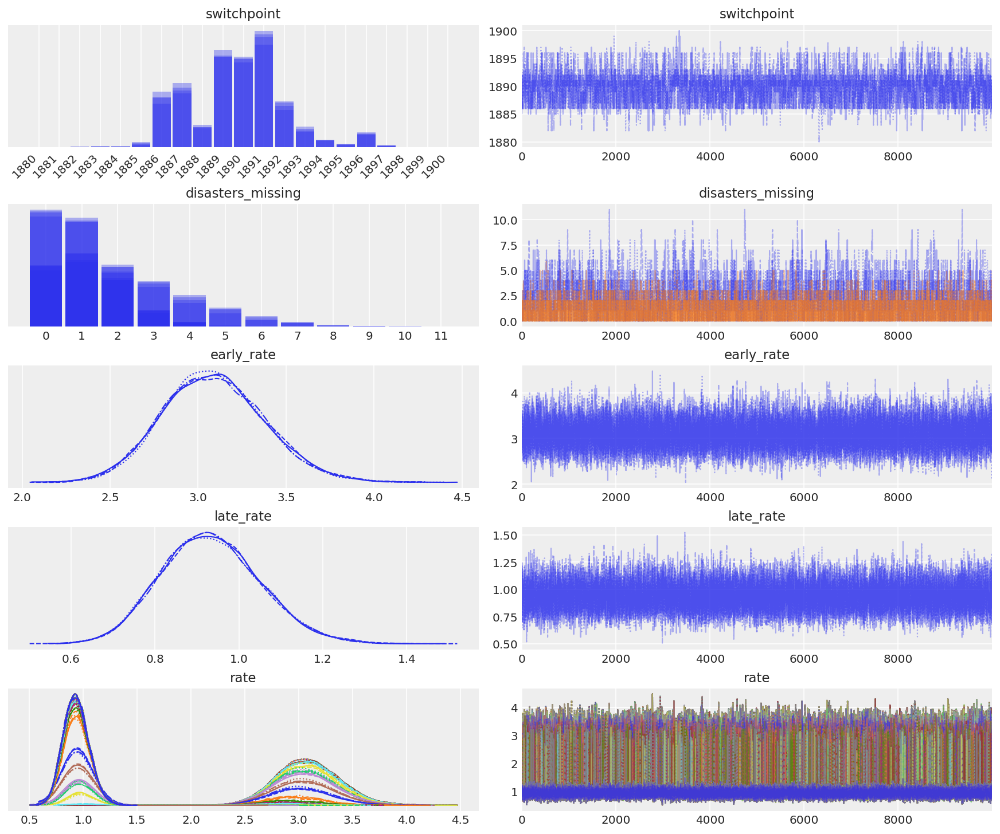

In [49]:
with disaster_model:
    axes_arr = az.plot_trace(trace)
plt.draw()
for ax in axes_arr.flatten():
    if ax.get_title() == "switchpoint":
        labels = [label.get_text() for label in ax.get_xticklabels()]
        ax.set_xticklabels(labels, rotation=45, ha="right")
        break
plt.draw()

/var/folders/mq/85gqchqx0zgg03bk5c8gqjpr0000gn/T/ipykernel_10062/279679391.py:22: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(ddat.Year.values, average_disasters, "k", lw=2, color='blue')


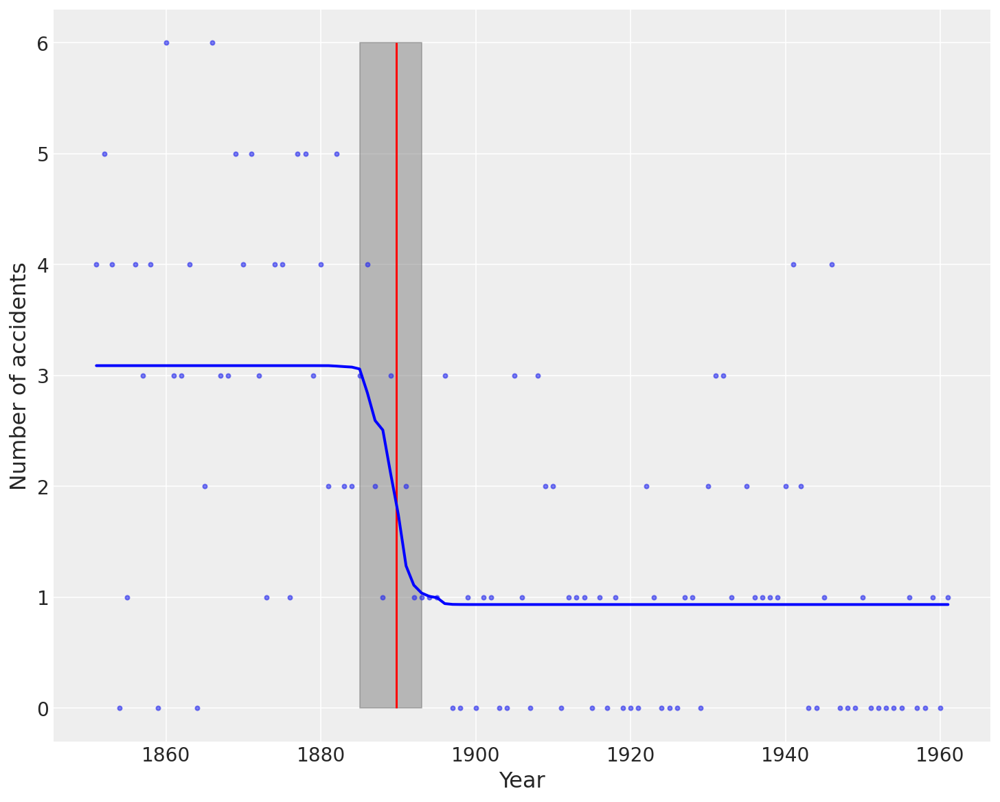

In [50]:
plt.figure(figsize=(10, 8))
plt.plot(ddat.Year.values, ddat.Event.values, ".", alpha=0.6)
plt.ylabel("Number of accidents", fontsize=16)
plt.xlabel("Year", fontsize=16)

plt.vlines(trace["switchpoint"].mean(), np.nanmin(ddat.Event.values), np.nanmax(ddat.Event.values), color="red")
average_disasters = np.zeros_like(ddat.Event.values, dtype="float")


for i, year in enumerate(ddat.Year.values):
    idx = year < trace["switchpoint"]
    average_disasters[i] = np.mean(np.where(idx, trace["early_rate"], trace["late_rate"]))

sp_hpd = az.hdi(trace["switchpoint"])
plt.fill_betweenx(
    y=[np.nanmin(ddat.Event.values), np.nanmax(ddat.Event.values)],
    x1=sp_hpd[0],
    x2=sp_hpd[1],
    alpha=0.5,
    color="grey"
)
plt.plot(ddat.Year.values, average_disasters, "k", lw=2, color='blue')

plt.show();

Most disasters took place until the 1880's which appears to be when safety regulations started to kick-in (and the number of disaster was brought under control).

The Poisson PMF is given as $\frac{\lambda^k e^{-\lambda}}{k!}\$

# Bayesian Estimation Supersedes the T-Test

### The Problem

This model replicates the example used in **Bayesian estimation supersedes the t-test** {cite:p}`kruschke2013`.

Several statistical inference procedures involve the comparison of two groups. We may be interested in whether one group is larger than another, or simply different from the other. We require a statistical model for this because true differences are usually accompanied by measurement or stochastic noise that prevent us from drawing conclusions simply from differences calculated from the observed data. 

The *de facto* standard for statistically comparing two (or more) samples is to use a statistical test. This involves expressing a null hypothesis, which typically claims that there is no difference between the groups, and using a chosen test statistic to determine whether the distribution of the observed data is plausible under the hypothesis. This rejection occurs when the calculated test statistic is higher than some pre-specified threshold value.

Unfortunately, it is not easy to conduct hypothesis tests correctly, and their results are very easy to misinterpret. Setting up a statistical test involves several subjective choices (*e.g.* statistical test to use, null hypothesis to test, significance level) by the user that are rarely justified based on the problem or decision at hand, but rather, are usually based on traditional choices that are entirely arbitrary {cite:p}`johnson1999`. The evidence that it provides to the user is indirect, incomplete, and typically overstates the evidence against the null hypothesis {cite:p}`goodman1999`. 

A more informative and effective approach for comparing groups is one based on **estimation** rather than **testing**, and is driven by Bayesian probability rather than frequentist. That is, rather than testing whether two groups are different, we instead pursue an estimate of how different they are, which is fundamentally more informative. Moreover, we include an estimate of uncertainty associated with that difference which includes uncertainty due to our lack of knowledge of the model parameters (epistemic uncertainty) and uncertainty due to the inherent stochasticity of the system (aleatory uncertainty).

## Example: Drug trial evaluation

To illustrate how this Bayesian estimation approach works in practice, we will use a fictitious example from {cite:t}`kruschke2013` concerning the evaluation of a clinical trial for drug evaluation. The trial aims to evaluate the efficacy of a "smart drug" that is supposed to increase intelligence by comparing IQ scores of individuals in a treatment arm (those receiving the drug) to those in a control arm (those recieving a placebo). There are 47 individuals and 42 individuals in the treatment and control arms, respectively.

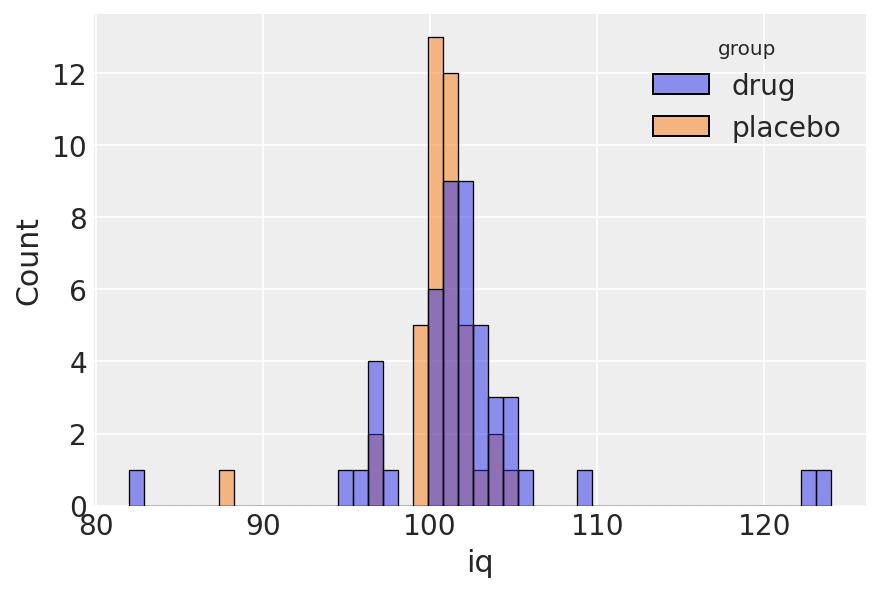

In [51]:
# fmt: off
iq_drug = np.array([
    101, 100, 102, 104, 102, 97, 105, 105, 98, 101, 100, 123, 105, 103, 
    100, 95, 102, 106, 109, 102, 82, 102, 100, 102, 102, 101, 102, 102,
    103, 103, 97, 97, 103, 101, 97, 104, 96, 103, 124, 101, 101, 100,
    101, 101, 104, 100, 101
])

iq_placebo = np.array([
    99, 101, 100, 101, 102, 100, 97, 101, 104, 101, 102, 102, 100, 105,
    88, 101, 100, 104, 100, 100, 100, 101, 102, 103, 97, 101, 101, 100,
    101, 99, 101, 100, 100, 101, 100, 99, 101, 100, 102, 99, 100, 99
])
# fmt: on

df1 = pd.DataFrame({"iq": iq_drug, "group": "drug"})
df2 = pd.DataFrame({"iq": iq_placebo, "group": "placebo"})
indv = pd.concat([df1, df2]).reset_index()

sns.histplot(data=indv, x="iq", hue="group");

In [52]:
rng = np.random.default_rng(seed=42)

The first step in a Bayesian approach to inference is to specify the full probability model that corresponds to the problem. For this example, Kruschke chooses a Student-t distribution to describe the distributions of the scores in each group. This choice adds robustness to the analysis, as a T distribution is less sensitive to outlier observations, relative to a normal distribution. The three-parameter Student-t distribution allows for the specification of a mean $\mu$, a precision (inverse-variance) $\lambda$ and a degrees-of-freedom parameter $\nu$:

$$f(x|\mu,\lambda,\nu) = \frac{\Gamma(\frac{\nu + 1}{2})}{\Gamma(\frac{\nu}{2})} \left(\frac{\lambda}{\pi\nu}\right)^{\frac{1}{2}} \left[1+\frac{\lambda(x-\mu)^2}{\nu}\right]^{-\frac{\nu+1}{2}}$$
           
The degrees-of-freedom parameter essentially specifies the "normality" of the data, since larger values of $\nu$ make the distribution converge to a normal distribution, while small values (close to zero) result in heavier tails. Thus, the likelihood functions of our model are specified as follows:

$$y^{(treat)}_i \sim T(\nu, \mu_1, \sigma_1)$$

$$y^{(placebo)}_i \sim T(\nu, \mu_2, \sigma_2)$$

As a simplifying assumption, we will assume that the degree of normality $\nu$ is the same for both groups. We will, of course, have separate parameters for the means $\mu_k, k=1,2$ and standard deviations $\sigma_k$. Since the means are real-valued, we will apply normal priors on them, and arbitrarily set the hyperparameters to the pooled empirical mean of the data and twice the pooled empirical standard deviation, which applies very diffuse information to these quantities (and importantly, does not favor one or the other *a priori*).

$$\mu_k \sim N(\bar{x}, 2s)$$

In [53]:
mu_m = indv.iq.mean()
mu_s = indv.iq.std() * 2

with pm.Model() as model:
    group1_mean = pm.Normal("group1_mean", mu=mu_m, sigma=mu_s)
    group2_mean = pm.Normal("group2_mean", mu=mu_m, sigma=mu_s)

The group standard deviations will be given a uniform prior over a plausible range of values for the variability of the outcome variable, IQ.

In Kruschke's original model, he uses a very wide uniform prior for the group standard deviations, from the pooled empirical standard deviation divided by 1000 to the pooled standard deviation multiplied by 1000. This is a poor choice of prior, because very basic prior knowledge about measures of human coginition dictate that the variation cannot ever be as high as this upper bound. IQ is a standardized measure, and hence this constrains how variable a given population's IQ values can be. When you place such a wide uniform prior on these values, you are essentially giving a lot of prior weight on inadmissable values. In this example, there is little practical difference, but in general it is best to apply as much prior information that you have available to the parameterization of prior distributions. 

We will instead set the group standard deviations to have a $\text{Uniform}(1,10)$ prior:

In [54]:
sigma_low = 1
sigma_high = 10

with model:
    group1_std = pm.Uniform("group1_std", lower=sigma_low, upper=sigma_high)
    group2_std = pm.Uniform("group2_std", lower=sigma_low, upper=sigma_high)

We follow Kruschke by making the prior for $\nu$ exponentially distributed with a mean of 30; this allocates high prior probability over the regions of the parameter that describe the range from normal to heavy-tailed data under the Student-T distribution.

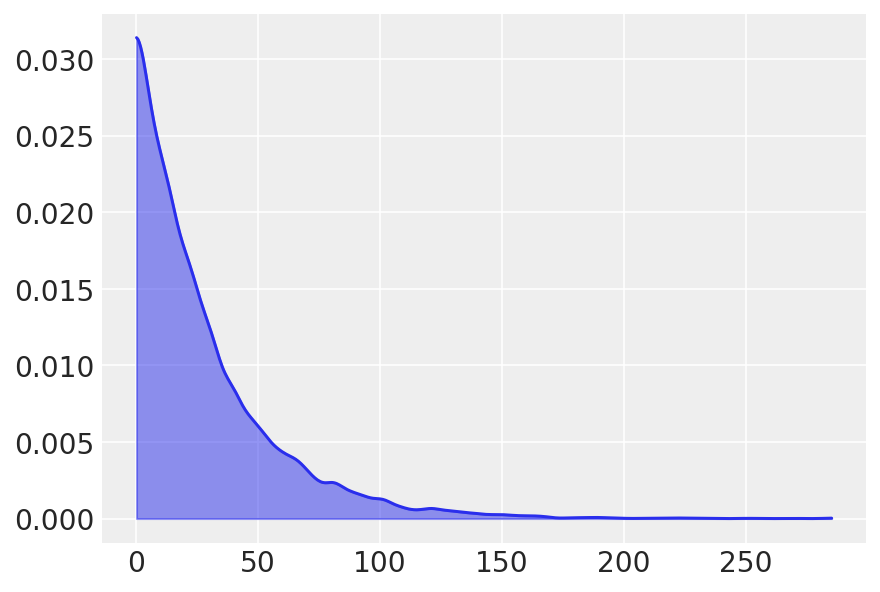

In [55]:
with model:
    nu = pm.Exponential("nu_minus_one", 1 / 29.0) + 1

az.plot_kde(rng.exponential(scale=30, size=10000), fill_kwargs={"alpha": 0.5});

Since PyMC parameterizes the Student-T in terms of precision, rather than standard deviation, we must transform the standard deviations before specifying our likelihoods.

In [56]:
with model:
    lambda_1 = group1_std**-2
    lambda_2 = group2_std**-2
    group1 = pm.StudentT("drug", nu=nu, mu=group1_mean, lam=lambda_1, observed=iq_drug)
    group2 = pm.StudentT("placebo", nu=nu, mu=group2_mean, lam=lambda_2, observed=iq_placebo)

Having fully specified our probabilistic model, we can turn our attention to calculating the comparisons of interest in order to evaluate the effect of the drug. To this end, we can specify deterministic nodes in our model for the difference between the group means and the difference between the group standard deviations. Wrapping them in named `Deterministic` objects signals to PyMC that we wish to record the sampled values as part of the output. As a joint measure of the groups, we will also estimate the "effect size", which is the difference in means scaled by the pooled estimates of standard deviation. This quantity can be harder to interpret, since it is no longer in the same units as our data, but the quantity is a function of all four estimated parameters.

In [57]:
with model:
    diff_of_means = pm.Deterministic("difference of means", group1_mean - group2_mean)
    diff_of_stds = pm.Deterministic("difference of stds", group1_std - group2_std)
    effect_size = pm.Deterministic(
        "effect size", diff_of_means / np.sqrt((group1_std**2 + group2_std**2) / 2)
    )

In [58]:
with model:
    idata = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [nu_minus_one, group2_std, group1_std, group2_mean, group1_mean]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 20 seconds.


In [59]:
pm.model_to_graphviz(model)

ExecutableNotFound: failed to execute PosixPath('dot'), make sure the Graphviz executables are on your systems' PATH

We can plot the stochastic parameters of the model. Arviz's `plot_posterior` function replicates the informative histograms portrayed in {cite:p}`kruschke2013`. These summarize the posterior distributions of the parameters, and present a 95% credible interval and the posterior mean. The plots below are constructed with the final 1000 samples from each of the chains, pooled together.

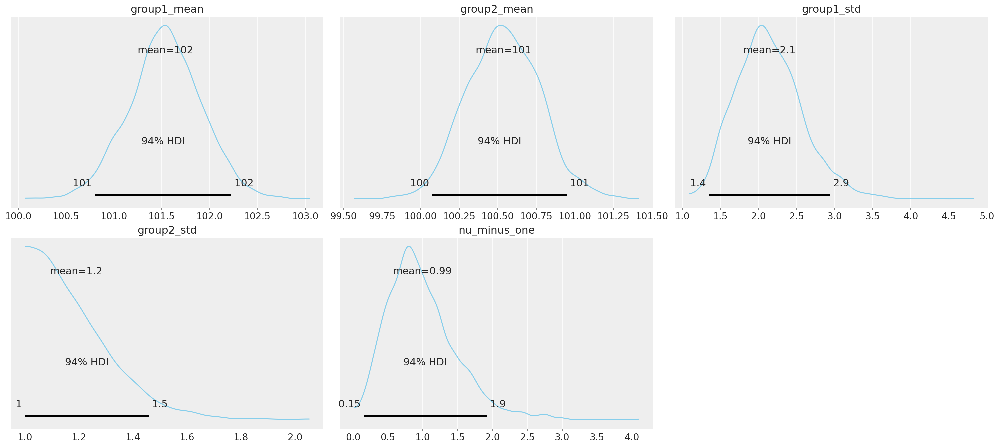

In [60]:
with model:
    az.plot_posterior(
        idata,
        var_names=["group1_mean", "group2_mean", "group1_std", "group2_std", "nu_minus_one"],
        color="#87ceeb",
    );

Looking at the group differences below, we can conclude that there are meaningful differences between the two groups for all three measures. For these comparisons, it is useful to use zero as a reference value (`ref_val`); providing this reference value yields cumulative probabilities for the posterior distribution on either side of the value. Thus, for the difference of means, at least 97% of the posterior probability are greater than zero, which suggests the group means are credibly different. The effect size and differences in standard deviation are similarly positive.

These estimates suggest that the "smart drug" increased both the expected scores, but also the variability in scores across the sample. So, this does not rule out the possibility that some recipients may be adversely affected by the drug at the same time others benefit.

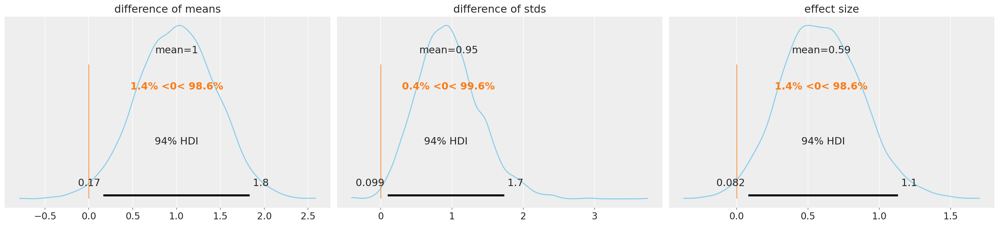

In [61]:
with model:
    az.plot_posterior(
        idata,
        var_names=["difference of means", "difference of stds", "effect size"],
        ref_val=0,
        color="#87ceeb",
    );

When `plot_forest` is called on a trace with more than one chain, it also plots the potential scale reduction parameter, which is used to reveal evidence for lack of convergence; values near one, as we have here, suggest that the model has converged.

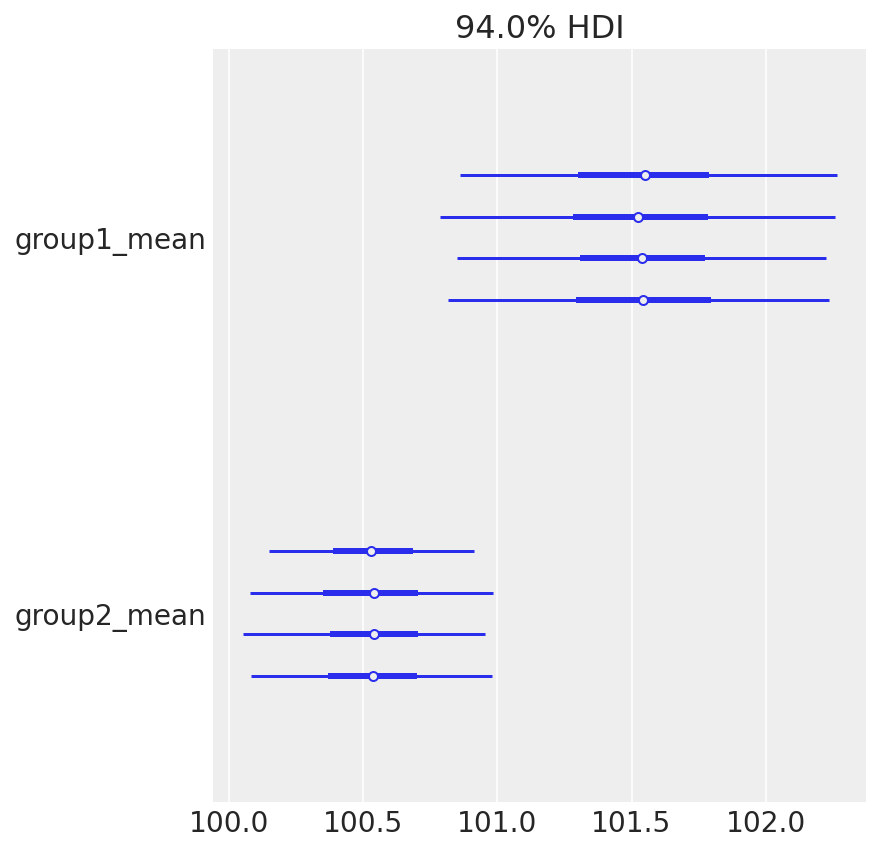

In [62]:
with model:
    az.plot_forest(idata, var_names=["group1_mean", "group2_mean"]);

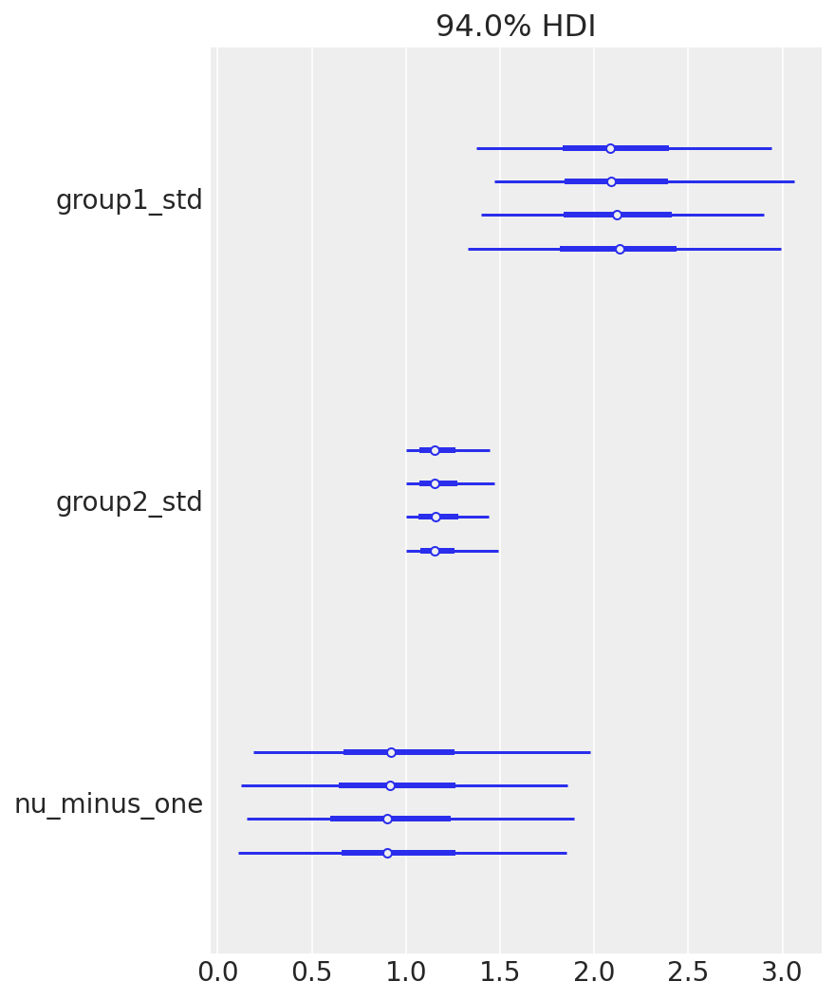

In [63]:
with model:
    az.plot_forest(idata, var_names=["group1_std", "group2_std", "nu_minus_one"]);

In [64]:
with model:
    display(az.summary(idata, var_names=["difference of means", "difference of stds", "effect size"]))

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
difference of means,1.001,0.446,0.166,1.834,0.010,0.007,2178.0,2278.0,1.0
difference of stds,0.952,0.443,0.099,1.735,0.009,0.006,2478.0,2321.0,1.0
effect size,0.593,0.282,0.082,1.131,0.006,0.004,2223.0,2174.0,1.0


"Bayesian Estimation Supersedes the T-Test" Authored by Andrew Straw Dec, 2012, and updated by Chris Fonnesbeck Dec, 2020

# ---------------------------------------------------------------------------------------

## HW tasks

Take the real estate house sale price data from the start of the notebook and implement the following regressions over different set of priors.

#### 1.  sale_price ~ gross_sq_feet
#### 2.  sale_price ~ gross_sq_feet + land_sq_feet + year_built

##### For both Tasks:
+ Use a reasonable set of priors for the variable coefficients, and different at ranges (for example: 100-1000, 200-600, 300-500, etc.)
+ Compare the your resulting distributions with OLS regression outputs.

#####  Note: Do not use an intercept term for task # 1.

##### 1. sale_price ~ gross_sq_feet

In [65]:
df=sample_all
df

,Unnamed: 0,borough,neighborhood,building_class_category,tax_class_present,block,lot,easement,building_class_present,address,...,land_sq_feet,gross_sq_feet,year_built,tax_class_time_sale,build_class_time_sale,sale_price,sale_date,serialid,sale_year,sale_month
0,5631,3,BAY RIDGE,01 ONE FAMILY HOMES,1,5871,91,NaN,A5,24 BAY RIDGE PLACE,...,1600,1400,1910,1,A5,585000.0,2009-10-29,5631,9,9
1,5635,3,BAY RIDGE,01 ONE FAMILY HOMES,1,5882,38,NaN,A5,7014 LOUISE TERRACE,...,1169,1224,1925,1,A5,515000.0,2009-10-15,5635,9,9
2,5636,3,BAY RIDGE,01 ONE FAMILY HOMES,1,5882,50,NaN,A5,7009 LOUISE TERRACE,...,945,1836,1925,1,A5,499900.0,2009-04-20,5636,9,3
3,5637,3,BAY RIDGE,01 ONE FAMILY HOMES,1,5882,80,NaN,A5,7002 COLONIAL ROAD,...,1121,1330,1925,1,A5,525000.0,2009-09-02,5637,9,8
4,5638,3,BAY RIDGE,01 ONE FAMILY HOMES,1,5882,81,NaN,A5,7004 COLONIAL ROAD,...,1118,1224,1925,1,A5,400000.0,2009-07-24,5638,9,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
304,223160,3,BAY RIDGE,01 ONE FAMILY HOMES,1,6118,67,NaN,A5,9419 WOGAN TERRACE,...,1083,1104,1930,1,A5,470000.0,2012-05-01,223160,12,4
305,223161,3,BAY RIDGE,01 ONE FAMILY HOMES,1,6118,68,NaN,A5,9417 WOGAN TERRACE,...,966,1104,1930,1,A5,575000.0,2012-08-29,223161,12,7
306,223164,3,BAY RIDGE,01 ONE FAMILY HOMES,1,6124,26,NaN,A5,162 96TH STREET,...,2500,1756,1925,1,A5,540000.0,2012-05-24,223164,12,4
307,223165,3,BAY RIDGE,01 ONE FAMILY HOMES,1,6124,39,NaN,A9,157 97TH STREET,...,2600,1400,1925,1,A9,690000.0,2012-03-05,223165,12,2


In [66]:
with pm.Model() as linear_model:
    x = df['gross_sq_feet']
    y = df['sale_price']

    # Intercept prior
    # intercept = pm.Normal('Intercept', mu = 15, sd = 5)
    
    # Slope prior
    slope = pm.Uniform('slope', lower=100, upper=1000)
    
    # Standard deviation prior
    sigma = pm.HalfNormal('sigma', sd = 10)
    
    # y_est is the specification of the Bayesian model (here linear regression) to be estimated.
    y_est = slope * x
    
    # define likelihood
    likelihood = pm.Normal('Y_obs', mu = y_est, sd = sigma, observed = y)
    
    # MCMC sampling
    # We use the Maximum a Posteriori (MAP) values as starting values for the MCMC sampling.
    start = pm.find_MAP()
    trace1 = pm.sample(1000, start=start, progressbar=True)

/var/folders/mq/85gqchqx0zgg03bk5c8gqjpr0000gn/T/ipykernel_10062/579619613.py:23: DeprecationWarning: Call to deprecated Parameter start. (renamed to `initvals` in PyMC v4.0.0) -- Deprecated since v3.11.5.
  trace1 = pm.sample(1000, start=start, progressbar=True)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, slope]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 18 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
slope,423.27,0.23,422.88,423.72,0.00,0.00,3021.71,2572.48,1.0
sigma,8256.42,5.05,8247.47,8266.28,0.09,0.06,3510.74,2971.68,1.0


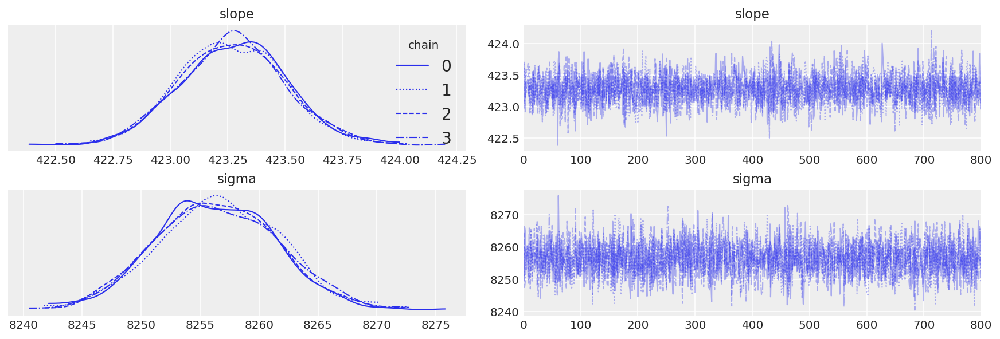

<Figure size 720x720 with 0 Axes>

In [67]:
# Show results after burn in of 200 MCMC replications.

with linear_model:
    az.plot_trace(trace1[199:1000], compact=True, combined=False, legend=True)
    plt.figure(figsize = (10, 10))
    display(az.summary(trace1, round_to=2));

In [68]:
# let's try with narrow priors
with pm.Model() as linear_model:
    x = df['gross_sq_feet']
    y = df['sale_price']

    # Intercept prior
    # intercept = pm.Normal('Intercept', mu = 15, sd = 5)
    
    # Slope prior
    slope = pm.Uniform('slope', lower=200, upper=600)
    
    # Standard deviation prior
    sigma = pm.HalfNormal('sigma', sd = 10)
    
    # y_est is the specification of the Bayesian model (here linear regression) to be estimated.
    y_est = slope * x
    
    # define likelihood
    likelihood = pm.Normal('Y_obs', mu = y_est, sd = sigma, observed = y)
    
    # MCMC sampling
    # We use the Maximum a Posteriori (MAP) values as starting values for the MCMC sampling.
    start = pm.find_MAP()
    trace2 = pm.sample(1000, start=start, progressbar=True)

/var/folders/mq/85gqchqx0zgg03bk5c8gqjpr0000gn/T/ipykernel_10062/2138427080.py:24: DeprecationWarning: Call to deprecated Parameter start. (renamed to `initvals` in PyMC v4.0.0) -- Deprecated since v3.11.5.
  trace2 = pm.sample(1000, start=start, progressbar=True)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, slope]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 18 seconds.
The acceptance probability does not match the target. It is 0.8834799010866954, but should be close to 0.8. Try to increase the number of tuning steps.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
slope,423.26,0.24,422.82,423.70,0.00,0.00,3518.44,2567.65,1.0
sigma,8256.52,5.03,8247.10,8266.01,0.08,0.06,3580.47,2855.57,1.0


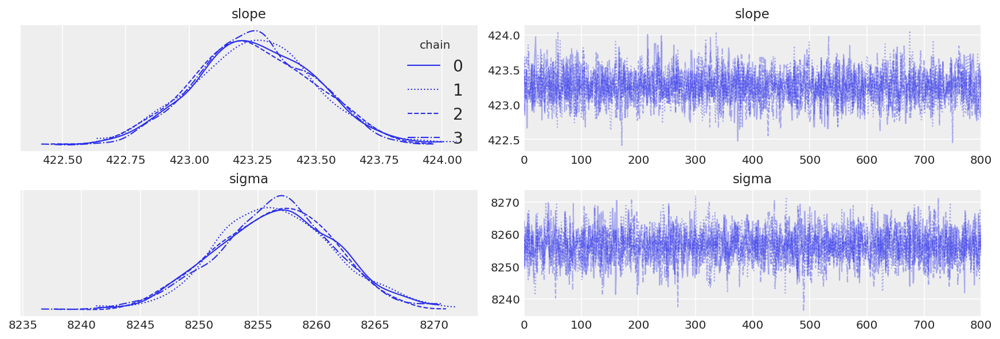

<Figure size 720x720 with 0 Axes>

In [69]:
# Show results after burn in of 200 MCMC replications.

with linear_model:
    az.plot_trace(trace2[199:1000], compact=True, combined=False, legend=True)
    plt.figure(figsize = (10, 10))
    display(az.summary(trace2, round_to=2));

In [70]:
# let's try with narrow priors
with pm.Model() as linear_model:
    x = df['gross_sq_feet']
    y = df['sale_price']

    # Intercept prior
    # intercept = pm.Normal('Intercept', mu = 15, sd = 5)
    
    # Slope prior
    # Slope prior
    slope = pm.Uniform('slope', lower=300, upper=500)
    
    # Standard deviation prior
    sigma = pm.HalfNormal('sigma', sd = 10)
    
    # y_est is the specification of the Bayesian model (here linear regression) to be estimated.
    y_est = slope * x
    
    # define likelihood
    likelihood = pm.Normal('Y_obs', mu = y_est, sd = sigma, observed = y)
    
    # MCMC sampling
    # We use the Maximum a Posteriori (MAP) values as starting values for the MCMC sampling.
    start = pm.find_MAP()
    trace3 = pm.sample(1000, start=start, progressbar=True)

/var/folders/mq/85gqchqx0zgg03bk5c8gqjpr0000gn/T/ipykernel_10062/423068382.py:25: DeprecationWarning: Call to deprecated Parameter start. (renamed to `initvals` in PyMC v4.0.0) -- Deprecated since v3.11.5.
  trace3 = pm.sample(1000, start=start, progressbar=True)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, slope]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 18 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
slope,423.26,0.23,422.83,423.69,0.00,0.00,3273.64,2892.22,1.0
sigma,8256.38,4.94,8247.02,8265.71,0.09,0.06,3292.40,3103.57,1.0


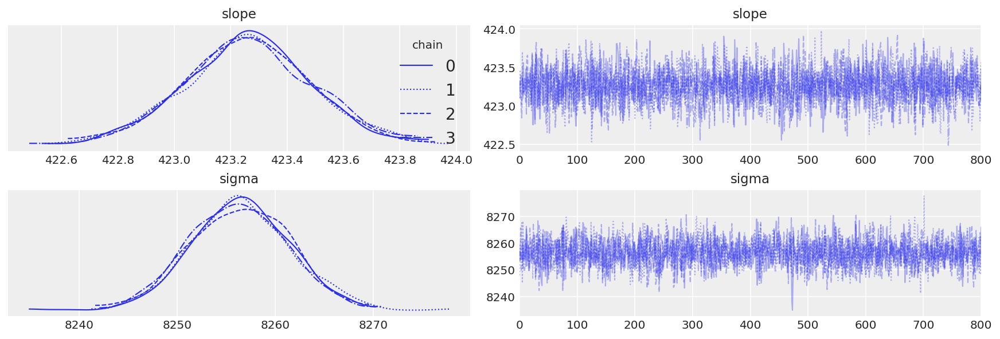

<Figure size 720x720 with 0 Axes>

In [71]:
# Show results after burn in of 200 MCMC replications.

with linear_model:
    az.plot_trace(trace3[199:1000], compact=True, combined=False, legend=True)
    plt.figure(figsize = (10, 10))
    display(az.summary(trace3, round_to=2));

In [72]:
with pm.Model() as linear_model:
    x = df['gross_sq_feet']
    y = df['sale_price']

    # Intercept prior
    # intercept = pm.Normal('Intercept', mu = 15, sd = 5)
    
    # Slope prior
    # Slope prior
    slope = pm.Normal('slope', mu = 423, sd=10)
    
    # Standard deviation prior
    sigma = pm.HalfNormal('sigma', sd = 10)
    
    # y_est is the specification of the Bayesian model (here linear regression) to be estimated.
    y_est = slope * x
    
    # define likelihood
    likelihood = pm.Normal('Y_obs', mu = y_est, sd = sigma, observed = y)
    
    # MCMC sampling
    # We use the Maximum a Posteriori (MAP) values as starting values for the MCMC sampling.
    start = pm.find_MAP()
    trace4 = pm.sample(1000, start=start, progressbar=True)

/var/folders/mq/85gqchqx0zgg03bk5c8gqjpr0000gn/T/ipykernel_10062/2385351580.py:24: DeprecationWarning: Call to deprecated Parameter start. (renamed to `initvals` in PyMC v4.0.0) -- Deprecated since v3.11.5.
  trace4 = pm.sample(1000, start=start, progressbar=True)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...


Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, slope]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 18 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
slope,423.27,0.23,422.85,423.71,0.00,0.00,3379.44,2718.84,1.0
sigma,8256.39,5.04,8246.79,8265.79,0.09,0.06,3388.69,2950.40,1.0


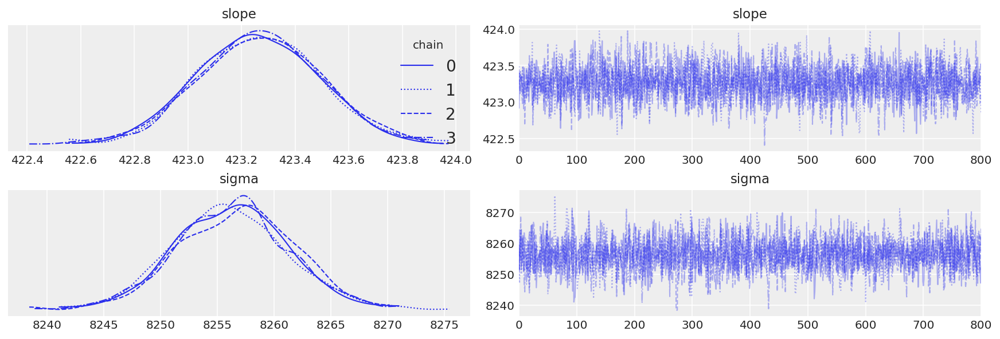

<Figure size 720x720 with 0 Axes>

In [73]:
with linear_model:
    az.plot_trace(trace4[199:1000], compact=True, combined=False, legend=True)
    plt.figure(figsize = (10, 10))
    display(az.summary(trace4, round_to=2));

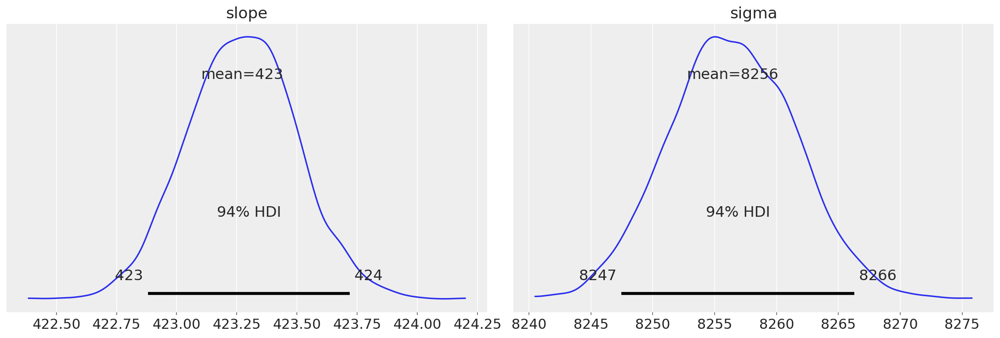

In [74]:
with linear_model:
    pm.plot_posterior(trace1, figsize = (15,5), textsize = 15);

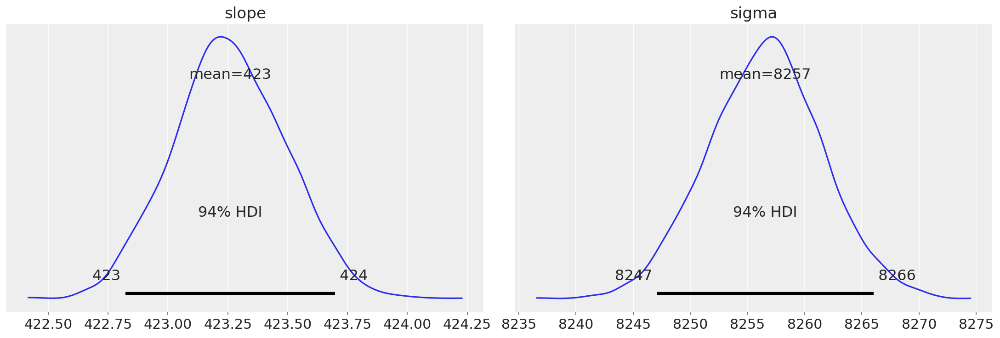

In [75]:
with linear_model:
    pm.plot_posterior(trace2, figsize = (15,5), textsize = 15);

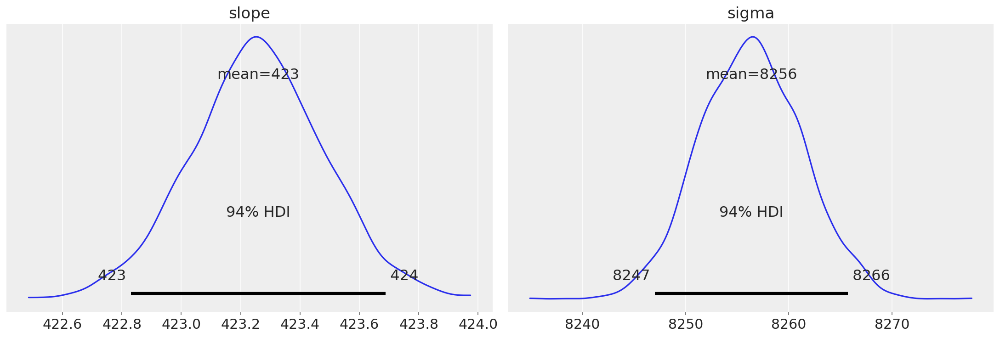

In [76]:
with linear_model:
    pm.plot_posterior(trace3, figsize = (15,5), textsize = 15);

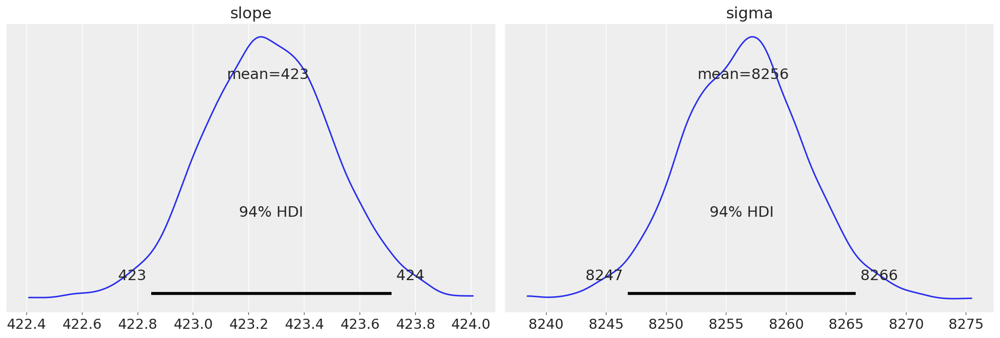

In [77]:
with linear_model:
    pm.plot_posterior(trace4, figsize = (15,5), textsize = 15);

In [78]:
# check parameters with linear regression

X = np.array(df[['gross_sq_feet']])
y = np.array(df[['sale_price']])
lr = sm.OLS(y, X).fit()
print('slope: ', lr.params[0])
print('95% confidence interval: ', 'slope: ', lr.conf_int(alpha=0.05, cols=None)[0])

slope:  423.26277491916903
95% confidence interval:  slope:  [402.19308368 444.33246616]


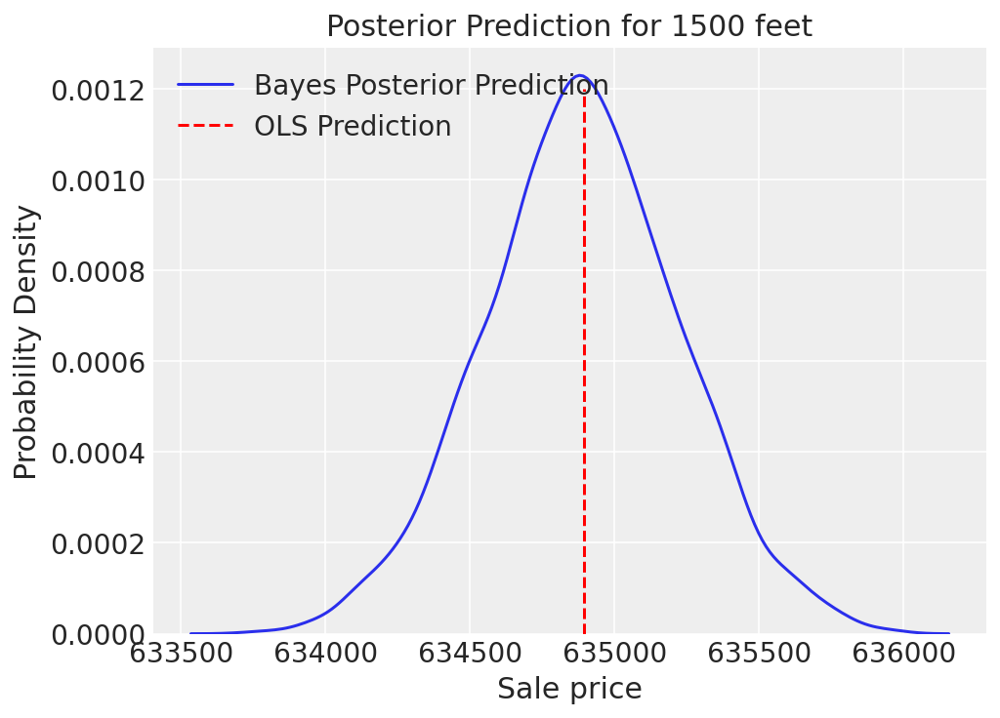

In [79]:
# posterior distribution for one data point (gross_feet=1500)

bayes_prediction = trace3['slope'] * 1500
plt.figure(figsize = (7, 5))
#plt.style.use('fivethirtyeight')
sns.kdeplot(bayes_prediction, label = 'Bayes Posterior Prediction')
plt.vlines(x = 423.26277491916903* 1500, 
           ymin = 0, ymax = 0.0012,
           label = 'OLS Prediction',
          colors = 'red', linestyles='--')

plt.legend(loc='upper left');
plt.xlabel('Sale price', size = 15), plt.ylabel('Probability Density', size = 15);
plt.title('Posterior Prediction for 1500 feet', size = 15);

##### 2. sale_price ~ gross_sq_feet + land_sq_feet + year_built

In [80]:
# posterior estimation with MCMC sampling

with pm.Model() as normal_model:    
    y = df['sale_price']
 
    # The prior for the model parameters
    alpha = pm.Normal('alpha', mu=0, sd=20)
    beta1 = pm.Normal('gross_sq_feet', mu=0, sd=20) 
    beta2 = pm.Normal('land_sq_feet', mu=0, sd=20)
    beta3 = pm.Normal('year_built', mu=0, sd=20)
    sigma = pm.HalfNormal('sigma', sd=10)
    
    # Creating the model requires a formula and data (and optionally a family)
    mean = alpha + beta1 * df['gross_sq_feet'] + beta2 * df['land_sq_feet'] + beta3 * df['year_built']
    # Observed values
    Y_obs = pm.Normal('Y_obs', mu = mean, sd = sigma, observed = y)
    
    # MCMC sampling
    # We use the Maximum a Posteriori (MAP) values as starting values for the MCMC sampling.
    start = pm.find_MAP()
    trace = pm.sample(1000, start=start, progressbar=True)

/var/folders/mq/85gqchqx0zgg03bk5c8gqjpr0000gn/T/ipykernel_10062/3762789246.py:21: DeprecationWarning: Call to deprecated Parameter start. (renamed to `initvals` in PyMC v4.0.0) -- Deprecated since v3.11.5.
  trace = pm.sample(1000, start=start, progressbar=True)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...


Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, year_built, land_sq_feet, gross_sq_feet, alpha]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 21 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,-0.84,20.39,-40.44,35.63,0.34,0.36,3646.50,2336.08,1.0
gross_sq_feet,9.68,0.74,8.31,11.04,0.01,0.01,2637.94,2321.01,1.0
land_sq_feet,257.48,0.39,256.76,258.21,0.01,0.01,2985.97,2465.88,1.0
year_built,62.49,0.57,61.44,63.55,0.01,0.01,3164.59,2577.33,1.0
sigma,6971.86,5.04,6962.61,6981.42,0.08,0.06,4183.58,2403.14,1.0


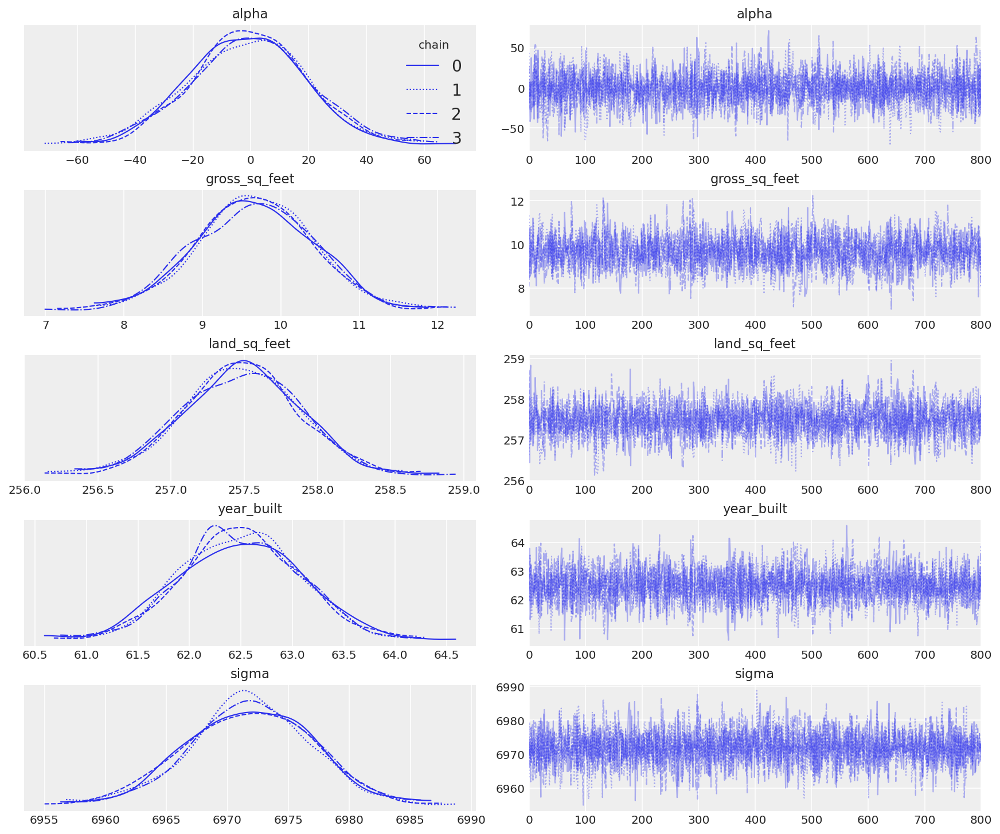

<Figure size 720x720 with 0 Axes>

In [81]:
with normal_model:
    az.plot_trace(trace[199:1000], compact=True, combined=False, legend=True)
    plt.figure(figsize = (10, 10))
    display(az.summary(trace, round_to=2));

/Users/ryanng/opt/anaconda3/lib/python3.9/site-packages/arviz/data/io_pymc3_3x.py:347: UserWarning: Could not compute log_likelihood, it will be omitted. Check your model object or set log_likelihood=False
  warnings.warn(warn_msg)


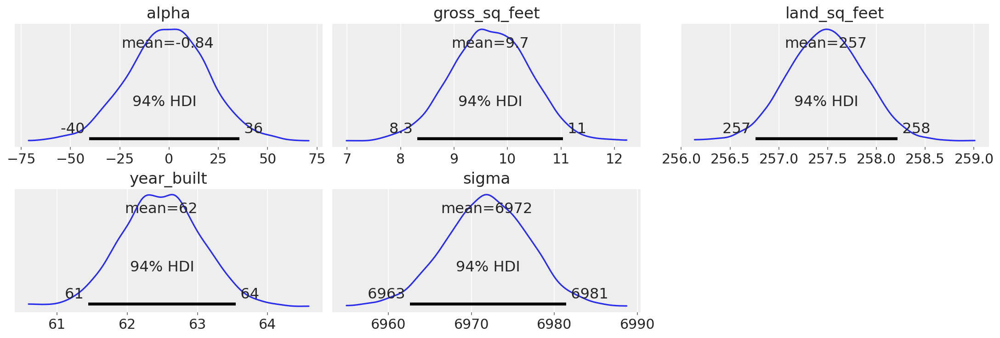

In [82]:
with linear_model:
    pm.plot_posterior(trace, figsize = (15,5), textsize = 15);

In [83]:
with pm.Model() as linear_model:    
    y = df['sale_price']
 
    # The prior for the model parameters
    alpha = pm.Normal('alpha',mu=0, sd=20)
    beta1 = pm.Uniform('gross_sq_feet', lower=-100, upper=100) 
    beta2 = pm.Uniform('land_sq_feet', lower=100, upper=1000)
    beta3 = pm.Uniform('year_built', lower=0, upper=100)
    sigma = pm.HalfNormal('sigma', sd=10)
    
    # Creating the model requires a formula and data (and optionally a family)
    mean = alpha + beta1 * df['gross_sq_feet'] + beta2 * df['land_sq_feet'] + beta3 * df['year_built']
    # Observed values
    Y_obs = pm.Normal('Y_obs', mu = mean, sd = sigma, observed = y)
    
    # MCMC sampling
    # We use the Maximum a Posteriori (MAP) values as starting values for the MCMC sampling.
    start = pm.find_MAP()
    trace1 = pm.sample(1000, start=start, progressbar=True)

/var/folders/mq/85gqchqx0zgg03bk5c8gqjpr0000gn/T/ipykernel_10062/566499660.py:19: DeprecationWarning: Call to deprecated Parameter start. (renamed to `initvals` in PyMC v4.0.0) -- Deprecated since v3.11.5.
  trace1 = pm.sample(1000, start=start, progressbar=True)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, year_built, land_sq_feet, gross_sq_feet, alpha]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 22 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,-0.11,20.19,-38.65,37.15,0.32,0.35,3979.59,2695.46,1.0
gross_sq_feet,9.54,0.73,8.23,10.96,0.01,0.01,2904.31,2429.48,1.0
land_sq_feet,257.55,0.38,256.87,258.27,0.01,0.00,3316.31,2841.10,1.0
year_built,62.52,0.56,61.50,63.61,0.01,0.01,2836.05,2666.05,1.0
sigma,6971.92,5.00,6962.40,6981.10,0.08,0.06,3600.22,2394.12,1.0


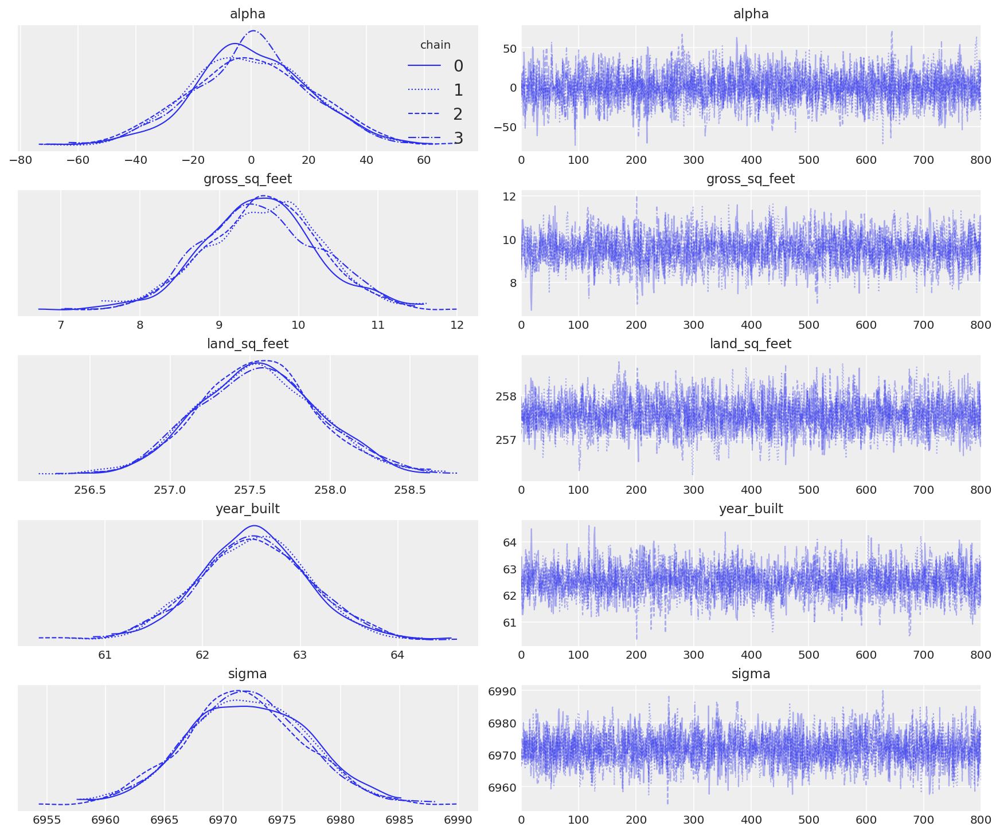

<Figure size 720x720 with 0 Axes>

In [84]:
with linear_model:
    az.plot_trace(trace1[199:1000], compact=True, combined=False, legend=True)
    plt.figure(figsize = (10, 10))
    display(az.summary(trace1, round_to=2));

In [85]:
with pm.Model() as linear_model:    
    y = df['sale_price']
 
    # The prior for the model parameters
    alpha = pm.Normal('alpha',mu=0, sd=20)
    beta1 = pm.Uniform('gross_sq_feet', lower=-50, upper=50) 
    beta2 = pm.Uniform('land_sq_feet', lower=100, upper=600)
    beta3 = pm.Uniform('year_built', lower=0, upper=100)
    sigma = pm.HalfNormal('sigma', sd=10)
    
    # Creating the model requires a formula and data (and optionally a family)
    mean = alpha + beta1 * df['gross_sq_feet'] + beta2 * df['land_sq_feet'] + beta3 * df['year_built']
    # Observed values
    Y_obs = pm.Normal('Y_obs', mu = mean, sd = sigma, observed = y)
    
    # MCMC sampling
    # We use the Maximum a Posteriori (MAP) values as starting values for the MCMC sampling.
    start = pm.find_MAP()
    trace2 = pm.sample(1000, start=start, progressbar=True)

/var/folders/mq/85gqchqx0zgg03bk5c8gqjpr0000gn/T/ipykernel_10062/1056167723.py:19: DeprecationWarning: Call to deprecated Parameter start. (renamed to `initvals` in PyMC v4.0.0) -- Deprecated since v3.11.5.
  trace2 = pm.sample(1000, start=start, progressbar=True)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, year_built, land_sq_feet, gross_sq_feet, alpha]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 21 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,-0.93,20.00,-39.73,36.11,0.33,0.34,3640.83,2524.80,1.0
gross_sq_feet,9.53,0.75,8.11,10.87,0.02,0.01,2440.02,2173.65,1.0
land_sq_feet,257.56,0.39,256.85,258.32,0.01,0.01,2834.65,2247.91,1.0
year_built,62.53,0.57,61.40,63.53,0.01,0.01,2869.43,2609.97,1.0
sigma,6971.84,4.98,6961.89,6980.65,0.08,0.06,3862.88,2619.48,1.0


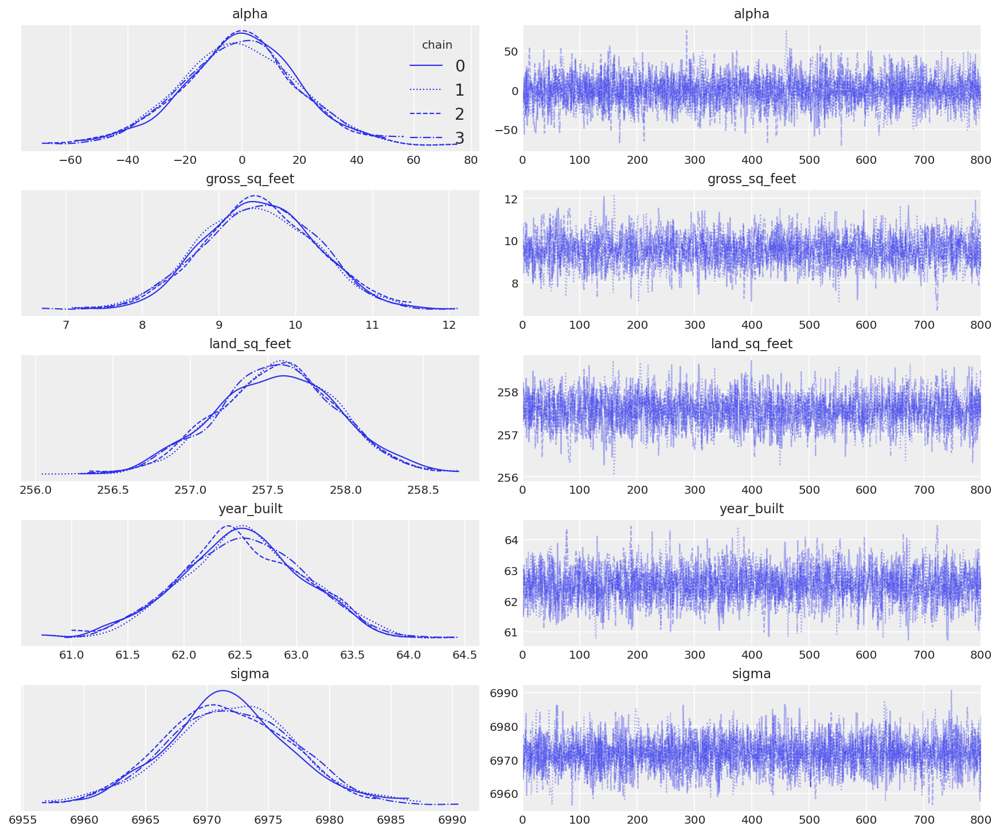

<Figure size 720x720 with 0 Axes>

In [86]:
with linear_model:
    az.plot_trace(trace2[199:1000], compact=True, combined=False, legend=True)
    plt.figure(figsize = (10, 10))
    display(az.summary(trace2, round_to=2));

In [87]:
with pm.Model() as linear_model:    
    y = df['sale_price']
 
    # The prior for the model parameters
    alpha = pm.Normal('alpha',mu=0, sd=20)
    beta1 = pm.Uniform('gross_sq_feet', lower=-50, upper=50) 
    beta2 = pm.Uniform('land_sq_feet', lower=100, upper=350)
    beta3 = pm.Uniform('year_built', lower=0, upper=100)
    sigma = pm.HalfNormal('sigma', sd=10)
    
    # Creating the model requires a formula and data (and optionally a family)
    mean = alpha + beta1 * df['gross_sq_feet'] + beta2 * df['land_sq_feet'] + beta3 * df['year_built']
    # Observed values
    Y_obs = pm.Normal('Y_obs', mu = mean, sd = sigma, observed = y)
    
    # MCMC sampling
    # We use the Maximum a Posteriori (MAP) values as starting values for the MCMC sampling.
    start = pm.find_MAP()
    trace3 = pm.sample(1000, start=start, progressbar=True)

/var/folders/mq/85gqchqx0zgg03bk5c8gqjpr0000gn/T/ipykernel_10062/2424835803.py:19: DeprecationWarning: Call to deprecated Parameter start. (renamed to `initvals` in PyMC v4.0.0) -- Deprecated since v3.11.5.
  trace3 = pm.sample(1000, start=start, progressbar=True)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, year_built, land_sq_feet, gross_sq_feet, alpha]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 21 seconds.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,0.02,19.62,-37.24,36.21,0.30,0.34,4261.57,2668.73,1.0
gross_sq_feet,9.54,0.73,8.15,10.92,0.01,0.01,2685.00,2289.08,1.0
land_sq_feet,257.56,0.39,256.84,258.29,0.01,0.01,2780.16,2491.14,1.0
year_built,62.51,0.58,61.38,63.60,0.01,0.01,3610.85,2879.30,1.0
sigma,6971.67,5.06,6962.67,6981.37,0.08,0.05,4317.07,2746.58,1.0


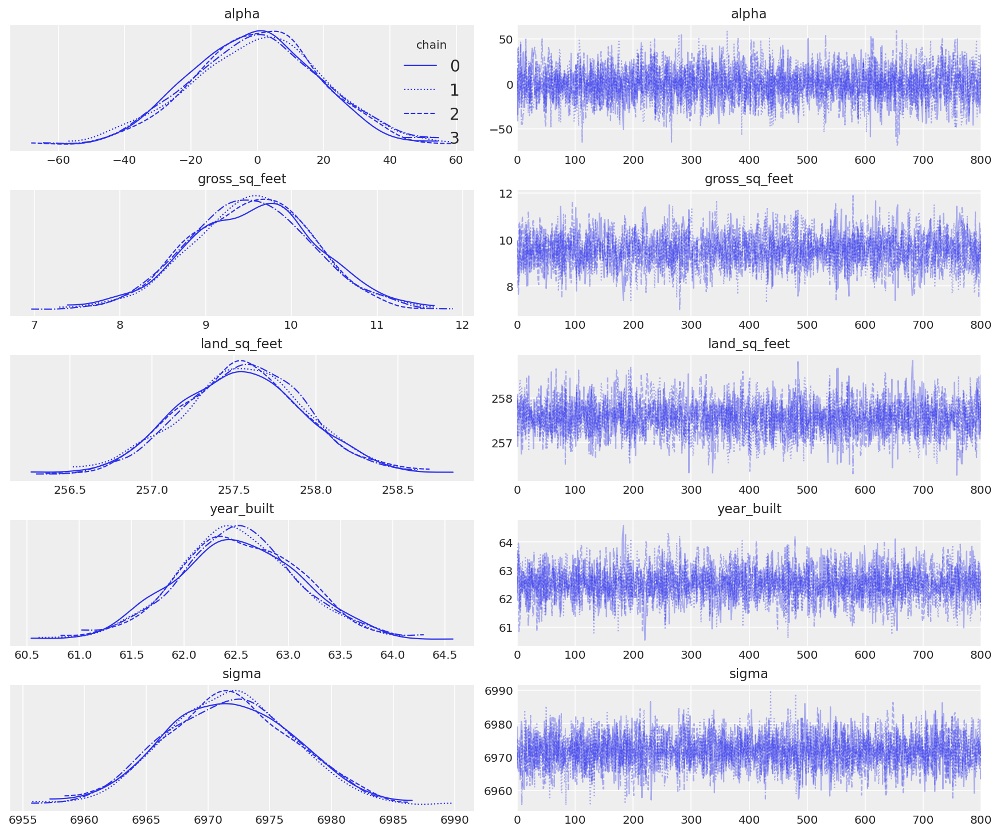

<Figure size 720x720 with 0 Axes>

In [88]:
with linear_model:
    az.plot_trace(trace3[199:1000], compact=True, combined=False, legend=True)
    plt.figure(figsize = (10, 10))
    display(az.summary(trace3, round_to=2));

In [89]:
# check parameters with linear regression

X = sm.add_constant(np.array(df[['gross_sq_feet','land_sq_feet','year_built']]))
y = np.array(df[['sale_price']])
lr = sm.OLS(y, X).fit()
print('Intercept: ', lr.params[0])
print('gross_sq_feet ', lr.params[1])
print('land_sq_feet ', lr.params[2])
print('year_built: ', lr.params[3])

print('95% confidence interval: ', 'Intercept: ', lr.conf_int(alpha=0.05, cols=None)[0])
print('95% confidence interval: ', 'gross_sq_feet: ', lr.conf_int(alpha=0.05, cols=None)[1])
print('95% confidence interval: ', 'land_sq_feet: ', lr.conf_int(alpha=0.05, cols=None)[2])
print('95% confidence interval: ', 'year_built: ', lr.conf_int(alpha=0.05, cols=None)[3])

Intercept:  -5839835.204384905
gross_sq_feet  12.404294372450863
land_sq_feet  254.5237988826774
year_built:  3100.7163456681137
95% confidence interval:  Intercept:  [-11073082.18594536   -606588.22282445]
95% confidence interval:  gross_sq_feet:  [-45.33723041  70.14581916]
95% confidence interval:  land_sq_feet:  [224.45054442 284.59705334]
95% confidence interval:  year_built:  [ 377.73098802 5823.70170332]


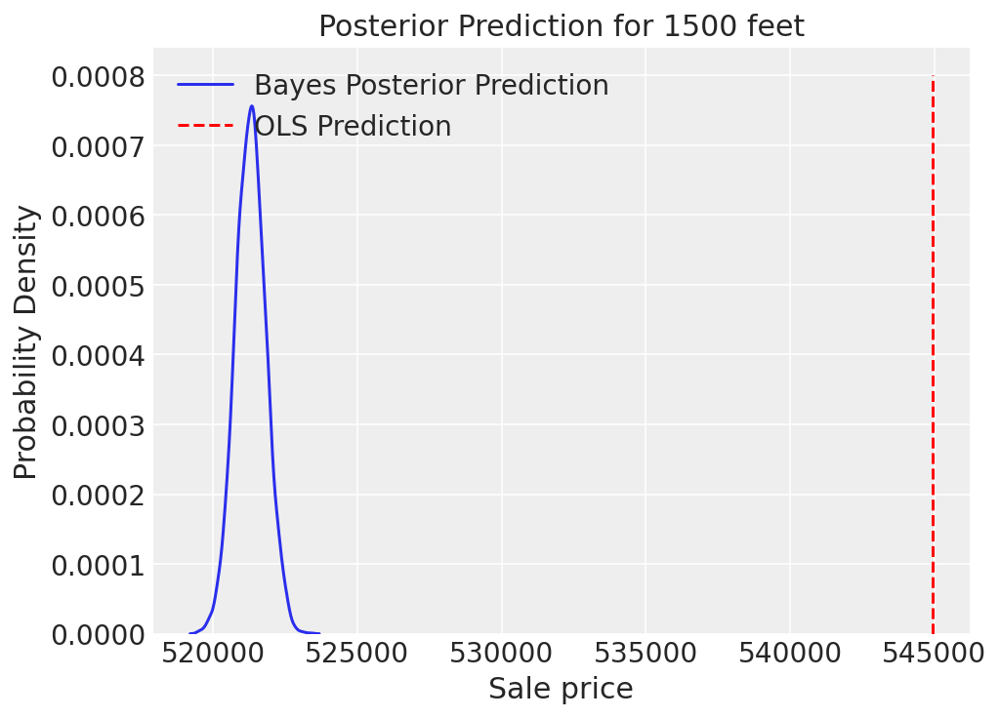

In [90]:
# posterior distribution for one data point (gross_feet=1500,land_feet=1500,year=1930)

bayes_prediction = trace3['gross_sq_feet'] * 1500+trace3['land_sq_feet'] * 1500+trace3['year_built'] * 1930+trace3['alpha']
plt.figure(figsize = (7, 5))
#plt.style.use('fivethirtyeight')
sns.kdeplot(bayes_prediction, label = 'Bayes Posterior Prediction')
plt.vlines(x = -5839835.204384905+12.404294372450863*1500+254.5237988826774*1500+3100.7163456681137*1930, 
           ymin = 0, ymax = 0.0008,
           label = 'OLS Prediction',
          colors = 'red', linestyles='--')

plt.legend(loc='upper left');
plt.xlabel('Sale price', size = 15), plt.ylabel('Probability Density', size = 15);
plt.title('Posterior Prediction for 1500 feet', size = 15);

###### According to the prediction of multiple regression compared with ols we found that there is a large error in the prediction due to the intercept with the parameter distribution of year we have a large error.

In [91]:
with pm.Model() as linear_model:    
    y = df['sale_price']
 
    # The prior for the model parameters
    alpha = pm.Normal('alpha',mu=0, sd=1000000)
    beta1 = pm.Uniform('gross_sq_feet', lower=-50, upper=50) 
    beta2 = pm.Uniform('land_sq_feet', lower=100, upper=350)
    beta3 = pm.Uniform('year_built', lower=0, upper=6000)
    sigma = pm.HalfNormal('sigma', sd=10)
    
    # Creating the model requires a formula and data (and optionally a family)
    mean = alpha + beta1 * df['gross_sq_feet'] + beta2 * df['land_sq_feet'] + beta3 * df['year_built']
    # Observed values
    Y_obs = pm.Normal('Y_obs', mu = mean, sd = sigma, observed = y)
    
    # MCMC sampling
    # We use the Maximum a Posteriori (MAP) values as starting values for the MCMC sampling.
    start = pm.find_MAP()
    trace4 = pm.sample(1000, start=start, progressbar=True)

/var/folders/mq/85gqchqx0zgg03bk5c8gqjpr0000gn/T/ipykernel_10062/3847668247.py:19: DeprecationWarning: Call to deprecated Parameter start. (renamed to `initvals` in PyMC v4.0.0) -- Deprecated since v3.11.5.
  trace4 = pm.sample(1000, start=start, progressbar=True)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, year_built, land_sq_feet, gross_sq_feet, alpha]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 94 seconds.
The acceptance probability does not match the target. It is 0.8884763323052162, but should be close to 0.8. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.8976079049114933, but should be close to 0.8. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.8883887861981441, but should be close to 0.8. Try to increase the number of tuning steps.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,-5811838.69,69338.17,-5940066.82,-5679037.75,1929.86,1364.93,1296.00,1271.82,1.0
gross_sq_feet,12.39,0.72,11.03,13.72,0.02,0.01,1922.62,2346.54,1.0
land_sq_feet,254.54,0.38,253.83,255.26,0.01,0.01,1918.76,2217.12,1.0
year_built,3086.16,36.08,3016.16,3151.86,1.00,0.71,1299.66,1306.98,1.0
sigma,6944.55,5.01,6935.06,6953.87,0.09,0.07,2812.95,2444.73,1.0


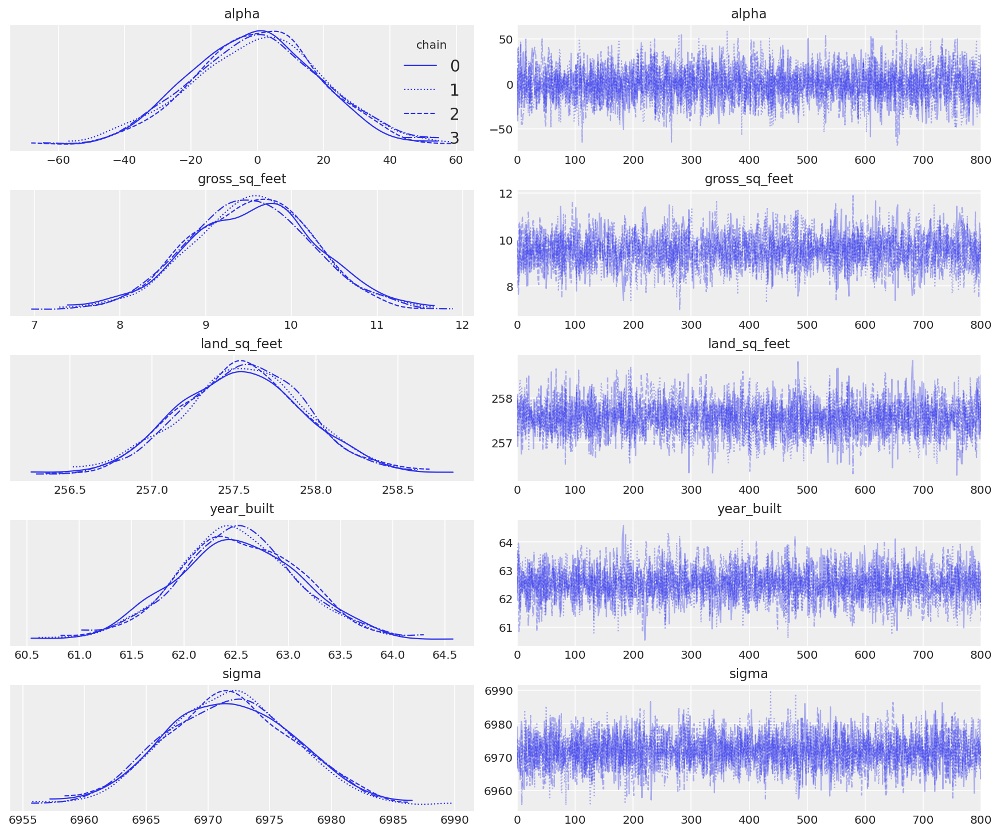

<Figure size 720x720 with 0 Axes>

In [92]:
with linear_model:
    az.plot_trace(trace3[199:1000], compact=True, combined=False, legend=True)
    plt.figure(figsize = (10, 10))
    display(az.summary(trace4, round_to=2));

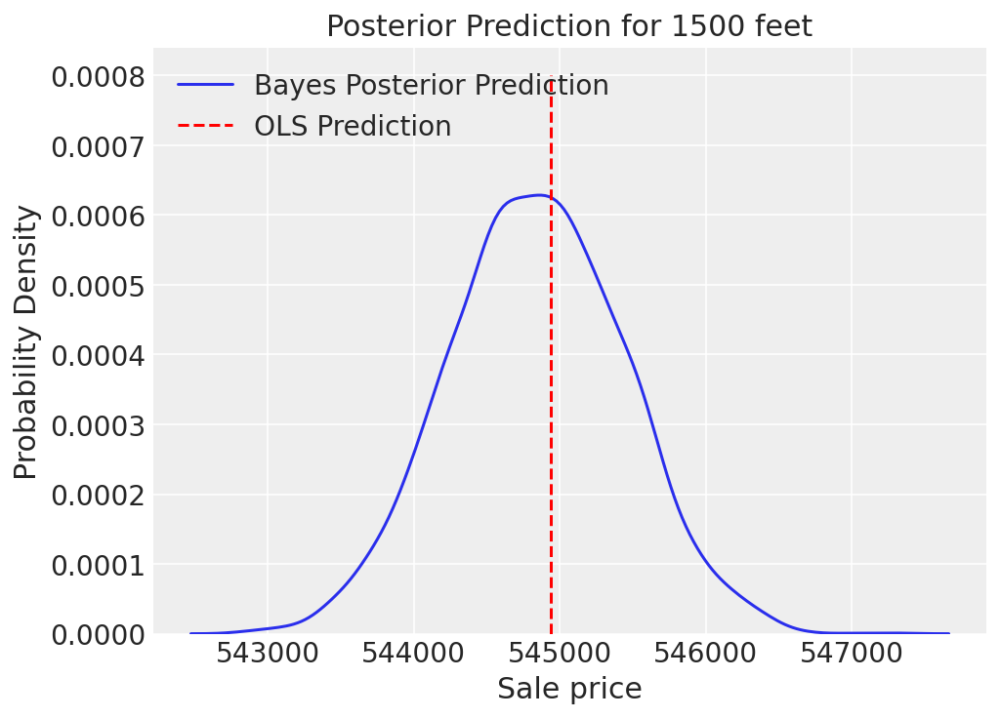

In [93]:
# posterior distribution for one data point (gross_feet=1500,land_feet=1500,year=1930)

bayes_prediction = trace4['gross_sq_feet'] * 1500+trace4['land_sq_feet'] * 1500+trace4['year_built'] * 1930+trace4['alpha']
plt.figure(figsize = (7, 5))
#plt.style.use('fivethirtyeight')
sns.kdeplot(bayes_prediction, label = 'Bayes Posterior Prediction')
plt.vlines(x = -5839835.204384905+12.404294372450863*1500+254.5237988826774*1500+3100.7163456681137*1930, 
           ymin = 0, ymax = 0.0008,
           label = 'OLS Prediction',
          colors = 'red', linestyles='--')

plt.legend(loc='upper left');
plt.xlabel('Sale price', size = 15), plt.ylabel('Probability Density', size = 15);
plt.title('Posterior Prediction for 1500 feet', size = 15);